In [1]:
# Cell 1: Setup & Initialization (FINAL)

import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import cm
import cv2
import time
import json
import warnings
from datetime import datetime
from pathlib import Path
from typing import Dict, List, Tuple, Optional, Union, Any

# Scientific computing
import scipy.io as sio
from scipy import ndimage
from scipy.spatial.distance import cdist

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.cuda.amp import autocast, GradScaler

# Visualization
from IPython.display import display, clear_output
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Suppress warnings
warnings.filterwarnings('ignore')

# -------------------------------------------------
# Device configuration
# -------------------------------------------------
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"✅ Using device: {device}")

if device.type == 'cuda':
    print(f"✅ GPU: {torch.cuda.get_device_name(0)}")
    print(f"✅ GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

# -------------------------------------------------
# AMP compatibility (safe for CPU & GPU)
# -------------------------------------------------
USE_AMP = device.type == 'cuda'

# -------------------------------------------------
# Reproducibility (CRITICAL for final model)
# -------------------------------------------------
def set_seed(seed: int = 42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)
print("🔒 Random seed set for reproducibility")


✅ Using device: cuda
✅ GPU: Tesla T4
✅ GPU Memory: 15.83 GB
🔒 Random seed set for reproducibility


In [2]:
# Cell 2: Mount Google Drive & Dataset Verification (FINAL)

from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# -------------------------------------------------
# Dataset path (ShanghaiTech)
# -------------------------------------------------
dataset_path = '/content/drive/MyDrive/Datasets/ShanghaiTech'
print(f"\n🔍 Checking dataset path: {dataset_path}")

# Fail fast if dataset is missing (FINAL BEHAVIOR)
if not os.path.exists(dataset_path):
    raise FileNotFoundError(
        f"\n❌ ShanghaiTech dataset not found at:\n{dataset_path}\n\n"
        "Please upload the dataset to Google Drive with this structure:\n\n"
        "ShanghaiTech/\n"
        "├── part_A/\n"
        "│   ├── train_data/\n"
        "│   │   ├── images/\n"
        "│   │   └── ground-truth/\n"
        "│   └── test_data/\n"
        "│       ├── images/\n"
        "│       └── ground-truth/\n"
        "└── part_B/\n"
    )

print("✅ Dataset root found")

# -------------------------------------------------
# Verify required subdirectories
# -------------------------------------------------
required_dirs = [
    'part_A/train_data/images',
    'part_A/train_data/ground-truth',
    'part_A/test_data/images',
    'part_A/test_data/ground-truth',
    'part_B/train_data/images',
    'part_B/train_data/ground-truth',
    'part_B/test_data/images',
    'part_B/test_data/ground-truth',
]

missing_dirs = []

for dir_path in required_dirs:
    full_path = os.path.join(dataset_path, dir_path)
    if os.path.exists(full_path):
        print(f"  ✅ {dir_path}")
    else:
        missing_dirs.append(dir_path)
        print(f"  ❌ Missing: {dir_path}")

# Final check
if missing_dirs:
    raise RuntimeError(
        "\n❌ Dataset structure is incomplete.\n"
        "Missing directories:\n" +
        "\n".join([f"  - {d}" for d in missing_dirs]) +
        "\n\nPlease fix the dataset before proceeding."
    )

print("\n✅ ShanghaiTech dataset structure verified successfully")


Mounted at /content/drive

🔍 Checking dataset path: /content/drive/MyDrive/Datasets/ShanghaiTech
✅ Dataset root found
  ✅ part_A/train_data/images
  ✅ part_A/train_data/ground-truth
  ✅ part_A/test_data/images
  ✅ part_A/test_data/ground-truth
  ✅ part_B/train_data/images
  ✅ part_B/train_data/ground-truth
  ✅ part_B/test_data/images
  ✅ part_B/test_data/ground-truth

✅ ShanghaiTech dataset structure verified successfully


In [3]:
# Cell 3: Configuration Class (FINAL)

class Config:
    """Central configuration for all parameters"""

    # -------------------------------------------------
    # Dataset paths
    # -------------------------------------------------
    DATASET_PATH = '/content/drive/MyDrive/Datasets/ShanghaiTech'
    PART_A_PATH = os.path.join(DATASET_PATH, 'part_A')
    PART_B_PATH = os.path.join(DATASET_PATH, 'part_B')

    # -------------------------------------------------
    # Model parameters
    # -------------------------------------------------
    IMG_SIZE = (512, 512)  # All images resized to this
    GAUSSIAN_SIGMA = 8.0
    GAUSSIAN_KERNEL_SIZE = 31  # MUST be odd (CRITICAL FIX)

    # -------------------------------------------------
    # Training parameters (FINAL-TUNED)
    # -------------------------------------------------
    BATCH_SIZE = 4
    LEARNING_RATE = 1e-4       # Faster, stable fine-tuning
    NUM_EPOCHS = 100
    WEIGHT_DECAY = 5e-4        # Standard CSRNet regularization
    DROPOUT_RATE = 0.5

    # -------------------------------------------------
    # Early stopping
    # -------------------------------------------------
    PATIENCE = 20
    MIN_DELTA = 0.001

    # -------------------------------------------------
    # Data augmentation
    # -------------------------------------------------
    USE_AUGMENTATION = True
    BRIGHTNESS_RANGE = (0.8, 1.2)
    CONTRAST_RANGE = (0.8, 1.2)

    # -------------------------------------------------
    # ROI Configuration
    # NOTE: ROI is defined in RESIZED IMAGE SPACE (512x512)
    # -------------------------------------------------
    ROI_COORDS = {
        'x1': 100,
        'y1': 150,
        'x2': 400,
        'y2': 450
    }

    # -------------------------------------------------
    # Control thresholds
    # -------------------------------------------------
    CONTROL_THRESHOLDS = {
        'NORMAL_MAX': 20,
        'WARNING_MAX': 40
    }

    # -------------------------------------------------
    # Temporal smoothing
    # -------------------------------------------------
    SMOOTHING_ALPHA = 0.3

    # -------------------------------------------------
    # Paths for saving
    # -------------------------------------------------
    SAVE_DIR = '/content/drive/MyDrive/Escalator_Control_Models'
    MODEL_NAME = 'csrnet_escalator.pth'
    LOG_DIR = './logs'

    @classmethod
    def setup_directories(cls):
        """Create necessary directories"""
        os.makedirs(cls.SAVE_DIR, exist_ok=True)
        os.makedirs(cls.LOG_DIR, exist_ok=True)

    @classmethod
    def display(cls):
        """Display current configuration"""
        print("\n⚙️ CONFIGURATION:")
        for key, value in cls.__dict__.items():
            if not key.startswith('_') and not callable(value):
                print(f"  {key}: {value}")

# Initialize configuration
Config.setup_directories()
Config.display()



⚙️ CONFIGURATION:
  DATASET_PATH: /content/drive/MyDrive/Datasets/ShanghaiTech
  PART_A_PATH: /content/drive/MyDrive/Datasets/ShanghaiTech/part_A
  PART_B_PATH: /content/drive/MyDrive/Datasets/ShanghaiTech/part_B
  IMG_SIZE: (512, 512)
  GAUSSIAN_SIGMA: 8.0
  GAUSSIAN_KERNEL_SIZE: 31
  BATCH_SIZE: 4
  LEARNING_RATE: 0.0001
  NUM_EPOCHS: 100
  WEIGHT_DECAY: 0.0005
  DROPOUT_RATE: 0.5
  PATIENCE: 20
  MIN_DELTA: 0.001
  USE_AUGMENTATION: True
  BRIGHTNESS_RANGE: (0.8, 1.2)
  CONTRAST_RANGE: (0.8, 1.2)
  ROI_COORDS: {'x1': 100, 'y1': 150, 'x2': 400, 'y2': 450}
  CONTROL_THRESHOLDS: {'NORMAL_MAX': 20, 'WARNING_MAX': 40}
  SMOOTHING_ALPHA: 0.3
  SAVE_DIR: /content/drive/MyDrive/Escalator_Control_Models
  MODEL_NAME: csrnet_escalator.pth
  LOG_DIR: ./logs
  setup_directories: <classmethod(<function Config.setup_directories at 0x7ede761ee160>)>
  display: <classmethod(<function Config.display at 0x7ede761ee340>)>


In [4]:
# Cell 4: Robust .mat File Loader (FINAL – SHANGHAITECH SAFE)

import os
import numpy as np
import scipy.io as sio

class MATLoader:
    """
    Robust loader for ShanghaiTech .mat files.
    Final version: fast, silent during training, safe for missing files.
    """

    @staticmethod
    def load_annotations(mat_path: str) -> np.ndarray:
        """
        Load annotation points from a .mat file.

        Returns:
            (N, 2) float32 array or empty array if not found
        """

        if not os.path.exists(mat_path):
            return np.empty((0, 2), dtype=np.float32)

        try:
            mat_data = sio.loadmat(
                mat_path,
                squeeze_me=True,
                struct_as_record=False
            )

            # ------------------------------------------------------------
            # FAST PATH: OFFICIAL SHANGHAITECH FORMAT
            # ------------------------------------------------------------
            if 'image_info' in mat_data:
                try:
                    pts = mat_data['image_info'].location
                    pts = np.asarray(pts, dtype=np.float32)
                    if pts.ndim == 2 and pts.shape[1] == 2:
                        return pts
                except Exception:
                    pass

            # ------------------------------------------------------------
            # FALLBACK 1: COMMON KEYS
            # ------------------------------------------------------------
            possible_keys = [
                'annPoints', 'gt_points', 'points',
                'location', 'anno', 'annotation', 'head_points'
            ]

            for key in possible_keys:
                if key in mat_data:
                    pts = np.asarray(mat_data[key], dtype=np.float32)
                    if pts.ndim == 2:
                        if pts.shape[0] == 2 and pts.shape[1] > 2:
                            pts = pts.T
                        if pts.shape[1] >= 2:
                            pts = pts[:, :2]
                            pts = pts[
                                ~np.any(np.isnan(pts) | np.isinf(pts), axis=1)
                            ]
                            if len(pts) > 0:
                                return pts

            # ------------------------------------------------------------
            # FALLBACK 2: HEURISTIC SEARCH
            # ------------------------------------------------------------
            for key, val in mat_data.items():
                if key.startswith('__'):
                    continue
                if isinstance(val, np.ndarray) and val.ndim == 2:
                    if val.shape[1] == 2 and np.all(val >= 0):
                        return val.astype(np.float32)

            # ------------------------------------------------------------
            # FALLBACK 3: DEEP SEARCH (LAST RESORT)
            # ------------------------------------------------------------
            def deep_search(obj):
                if isinstance(obj, np.ndarray) and obj.ndim == 2:
                    if obj.shape[1] == 2:
                        return obj.astype(np.float32)
                    if obj.shape[0] == 2:
                        return obj.T.astype(np.float32)
                if isinstance(obj, dict):
                    for v in obj.values():
                        r = deep_search(v)
                        if r is not None:
                            return r
                if isinstance(obj, (list, tuple)):
                    for v in obj:
                        r = deep_search(v)
                        if r is not None:
                            return r
                return None

            pts = deep_search(mat_data)
            if pts is not None:
                return pts

            return np.empty((0, 2), dtype=np.float32)

        except Exception:
            return np.empty((0, 2), dtype=np.float32)

    @staticmethod
    def test_loader(sample_dir: str):
        """Explicit test (prints allowed here)"""

        if not os.path.exists(sample_dir):
            print(f"❌ Directory not found: {sample_dir}")
            return None

        mat_files = [f for f in os.listdir(sample_dir) if f.endswith('.mat')]
        if not mat_files:
            print(f"❌ No .mat files found in {sample_dir}")
            return None

        test_file = os.path.join(sample_dir, mat_files[0])
        print(f"🧪 Testing MATLoader on: {test_file}")

        points = MATLoader.load_annotations(test_file)

        print(f"📊 Loaded {len(points)} points")
        if len(points) > 0:
            print(f"📐 Shape: {points.shape}")
            print(f"📍 First 3 points:\n{points[:3]}")
            print(f"📈 X range: {points[:,0].min():.1f} – {points[:,0].max():.1f}")
            print(f"📈 Y range: {points[:,1].min():.1f} – {points[:,1].max():.1f}")

        return points


# ------------------------------------------------------------
# RUN TEST
# ------------------------------------------------------------
print("🧪 Testing MATLoader...")
_ = MATLoader.test_loader(
    "/content/drive/MyDrive/Datasets/ShanghaiTech/part_A/train_data/ground-truth"
)
print("✅ MATLoader test complete")


🧪 Testing MATLoader...
🧪 Testing MATLoader on: /content/drive/MyDrive/Datasets/ShanghaiTech/part_A/train_data/ground-truth/GT_IMG_126.mat
📊 Loaded 279 points
📐 Shape: (279, 2)
📍 First 3 points:
[[133.6265    474.5653   ]
 [  3.7084196 453.0828   ]
 [ 46.673454  372.2676   ]]
📈 X range: 1.7 – 1018.5
📈 Y range: 68.4 – 560.5
✅ MATLoader test complete


🔍 DATASET VERIFICATION
🔍 Verifying dataset structure...

  ✅ part_A/train_data/images: 300 files
  ✅ part_A/train_data/ground-truth: 300 files
  ✅ part_A/test_data/images: 182 files
  ✅ part_A/test_data/ground-truth: 182 files
  ✅ part_B/train_data/images: 400 files
  ✅ part_B/train_data/ground-truth: 400 files
  ✅ part_B/test_data/images: 316 files
  ✅ part_B/test_data/ground-truth: 316 files

📊 VERIFICATION SUMMARY
----------------------------------------
✅ No critical issues found

✅ No warnings

🎨 Displaying 3 sample images...



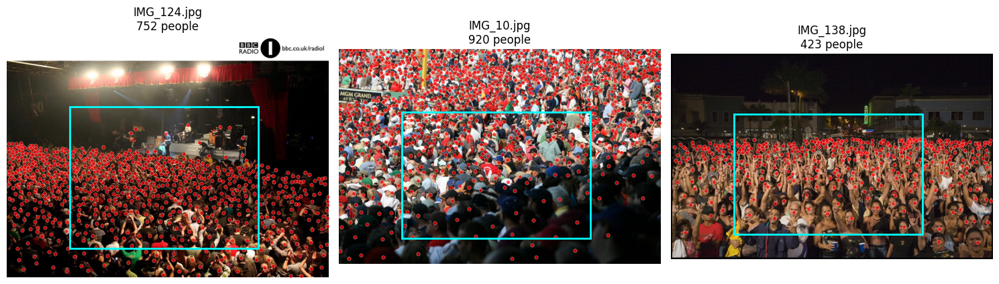

In [5]:
# Cell 5: Dataset Verification (FINAL)

class DatasetVerifier:
    """Verify ShanghaiTech dataset structure and integrity (final version)"""

    @staticmethod
    def verify_structure(base_path: str = Config.DATASET_PATH, mat_samples: int = 3):
        """Verify dataset structure and annotation integrity"""
        print("🔍 Verifying dataset structure...\n")

        expected_structure = {
            'part_A/train_data/images': 'jpg',
            'part_A/train_data/ground-truth': 'mat',
            'part_A/test_data/images': 'jpg',
            'part_A/test_data/ground-truth': 'mat',
            'part_B/train_data/images': 'jpg',
            'part_B/train_data/ground-truth': 'mat',
            'part_B/test_data/images': 'jpg',
            'part_B/test_data/ground-truth': 'mat',
        }

        critical_issues = []
        warnings = []

        for rel_path, expected_ext in expected_structure.items():
            full_path = os.path.join(base_path, rel_path)

            if not os.path.exists(full_path):
                critical_issues.append(f"Missing directory: {rel_path}")
                continue

            files = os.listdir(full_path)
            if not files:
                warnings.append(f"Empty directory: {rel_path}")
                continue

            ext_files = [f for f in files if f.lower().endswith(f'.{expected_ext}')]
            if not ext_files:
                critical_issues.append(f"No .{expected_ext} files in {rel_path}")
                continue

            print(f"  ✅ {rel_path}: {len(ext_files)} files")

            # Validate annotation content
            if expected_ext == 'mat':
                sample_files = ext_files[:mat_samples]
                for f in sample_files:
                    mat_path = os.path.join(full_path, f)
                    pts = MATLoader.load_annotations(mat_path)
                    if len(pts) == 0:
                        warnings.append(f"Empty annotation file: {f}")

        print("\n📊 VERIFICATION SUMMARY")
        print("-" * 40)

        if critical_issues:
            print("❌ CRITICAL ISSUES FOUND:")
            for issue in critical_issues:
                print(f"  - {issue}")
            raise RuntimeError("Dataset verification failed. Fix issues before proceeding.")
        else:
            print("✅ No critical issues found")

        if warnings:
            print("\n⚠️ WARNINGS:")
            for w in warnings:
                print(f"  - {w}")
        else:
            print("\n✅ No warnings")

        return True

    @staticmethod
    def sample_images(num_samples: int = 3):
        """Display sample images with annotations and ROI"""
        print(f"\n🎨 Displaying {num_samples} sample images...\n")

        img_dir = os.path.join(Config.PART_A_PATH, 'train_data', 'images')
        gt_dir = os.path.join(Config.PART_A_PATH, 'train_data', 'ground-truth')

        if not os.path.exists(img_dir) or not os.path.exists(gt_dir):
            print("❌ Sample directories not found")
            return

        img_files = [
            f for f in os.listdir(img_dir)
            if f.lower().endswith(('.jpg', '.jpeg', '.png'))
        ][:num_samples]

        fig, axes = plt.subplots(1, len(img_files), figsize=(5 * len(img_files), 5))
        if len(img_files) == 1:
            axes = [axes]

        for idx, img_file in enumerate(img_files):
            img_path = os.path.join(img_dir, img_file)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            h, w = img.shape[:2]

            # Load GT
            gt_file = 'GT_' + img_file.replace('.jpg', '.mat')
            gt_path = os.path.join(gt_dir, gt_file)
            points = MATLoader.load_annotations(gt_path)

            axes[idx].imshow(img)
            if len(points) > 0:
                axes[idx].scatter(
                    points[:, 0], points[:, 1],
                    c='red', s=15, alpha=0.7,
                    edgecolors='white', linewidths=0.3
                )

            # Scale ROI from resized space to original image
            scale_x = w / Config.IMG_SIZE[1]
            scale_y = h / Config.IMG_SIZE[0]
            roi = Config.ROI_COORDS

            rect = patches.Rectangle(
                (roi['x1'] * scale_x, roi['y1'] * scale_y),
                (roi['x2'] - roi['x1']) * scale_x,
                (roi['y2'] - roi['y1']) * scale_y,
                linewidth=2, edgecolor='cyan', facecolor='none'
            )
            axes[idx].add_patch(rect)

            axes[idx].set_title(f"{img_file}\n{len(points)} people")
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()


# -------------------------------------------------
# RUN VERIFICATION
# -------------------------------------------------
print("🔍 DATASET VERIFICATION")
DatasetVerifier.verify_structure()
DatasetVerifier.sample_images(num_samples=3)


🧪 Testing Density Map Generation...
📊 Density map sum (should be ≈ 4): 4.0000
📐 Shape: (100, 150)


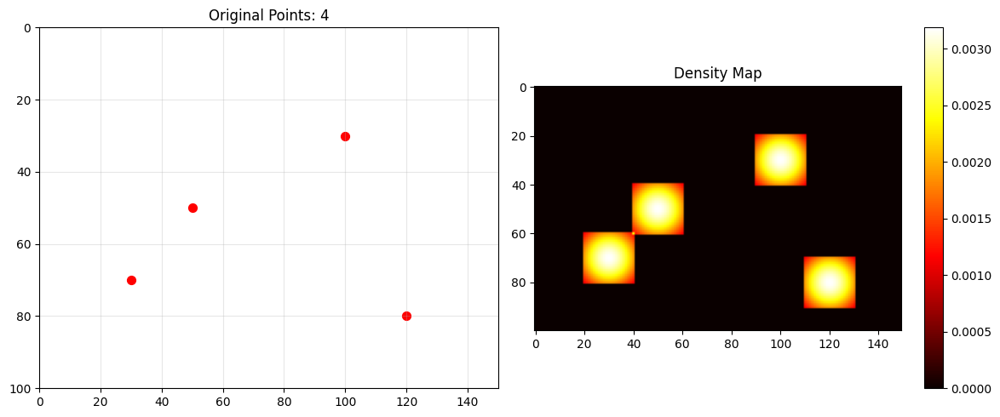

In [6]:
# Cell 6: Density Map Generator (FINAL – COUNT PRESERVING)

class DensityMapGenerator:
    """Generate density maps from point annotations (final version)"""

    @staticmethod
    def gaussian_filter_density(
        points: np.ndarray,
        img_shape: Tuple[int, int],
        sigma: float = Config.GAUSSIAN_SIGMA,
        kernel_size: int = Config.GAUSSIAN_KERNEL_SIZE
    ) -> np.ndarray:
        """
        Generate density map using Gaussian kernel.
        Guarantees sum(density_map) ≈ number of points.
        """

        density_map = np.zeros(img_shape, dtype=np.float32)

        if len(points) == 0:
            return density_map

        # --------------------------------------------------
        # Safety checks
        # --------------------------------------------------
        sigma = max(float(sigma), 1e-6)

        if kernel_size % 2 == 0:
            kernel_size += 1  # force odd

        h, w = img_shape

        # Clip points to bounds
        points = points.copy()
        points[:, 0] = np.clip(points[:, 0], 0, w - 1)
        points[:, 1] = np.clip(points[:, 1], 0, h - 1)

        kernel_radius = kernel_size // 2
        kernel = DensityMapGenerator._create_gaussian_kernel(sigma, kernel_size)

        for x_f, y_f in points:
            x, y = int(x_f), int(y_f)

            # Image bounds
            x_min = max(0, x - kernel_radius)
            x_max = min(w, x + kernel_radius + 1)
            y_min = max(0, y - kernel_radius)
            y_max = min(h, y + kernel_radius + 1)

            # Kernel bounds
            k_x_min = kernel_radius - (x - x_min)
            k_x_max = k_x_min + (x_max - x_min)
            k_y_min = kernel_radius - (y - y_min)
            k_y_max = k_y_min + (y_max - y_min)

            cropped_kernel = kernel[k_y_min:k_y_max, k_x_min:k_x_max]

            # 🔒 RENORMALIZE to preserve count
            if cropped_kernel.sum() > 0:
                cropped_kernel = cropped_kernel / cropped_kernel.sum()

            density_map[y_min:y_max, x_min:x_max] += cropped_kernel

        return density_map

    @staticmethod
    def _create_gaussian_kernel(sigma: float, kernel_size: int) -> np.ndarray:
        """Create normalized 2D Gaussian kernel"""

        center = kernel_size // 2
        x, y = np.meshgrid(
            np.arange(kernel_size) - center,
            np.arange(kernel_size) - center
        )

        kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
        kernel /= kernel.sum()
        return kernel

    @staticmethod
    def test_generation():
        """Test density map generation"""

        print("🧪 Testing Density Map Generation...")

        h, w = 100, 150
        points = np.array([
            [50, 50],
            [100, 30],
            [30, 70],
            [120, 80]
        ], dtype=np.float32)

        density_map = DensityMapGenerator.gaussian_filter_density(
            points, (h, w), sigma=10, kernel_size=20
        )

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        axes[0].scatter(points[:, 0], points[:, 1], c='red', s=50)
        axes[0].set_xlim(0, w)
        axes[0].set_ylim(h, 0)
        axes[0].set_title(f'Original Points: {len(points)}')
        axes[0].grid(True, alpha=0.3)

        im = axes[1].imshow(density_map, cmap='hot')
        axes[1].set_title('Density Map')
        plt.colorbar(im, ax=axes[1])

        print(f"📊 Density map sum (should be ≈ {len(points)}): {density_map.sum():.4f}")
        print(f"📐 Shape: {density_map.shape}")

        plt.tight_layout()
        plt.show()

        return density_map


# --------------------------------------------------
# RUN TEST
# --------------------------------------------------
test_density = DensityMapGenerator.test_generation()


🧪 Testing Dataset Class...
📁 Loaded 300 images from train set
✅ Dataset size: 300


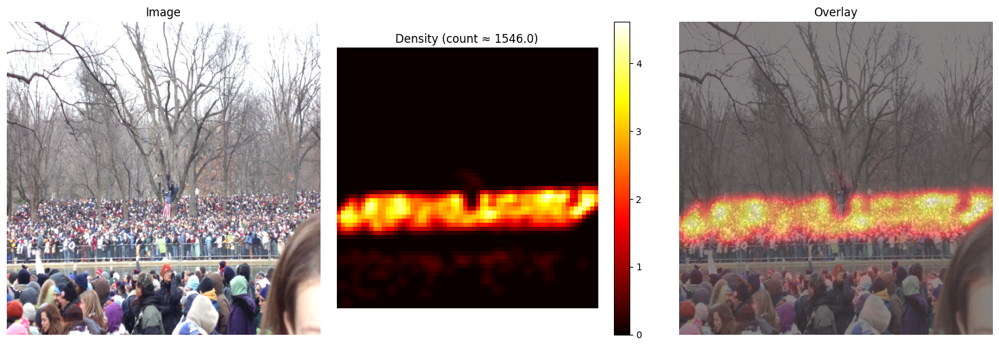

📊 Image shape: (512, 512, 3)
📊 Density shape: (64, 64)
👥 Estimated count: 1546.00


In [7]:
# Cell 7: Custom Dataset Class (FINAL – CSRNET READY)

class ShanghaiTechDataset(Dataset):
    """Custom Dataset for ShanghaiTech with CSRNet-compatible density maps"""

    def __init__(self, data_dir: str, mode: str = 'train', transform=None):
        self.data_dir = data_dir
        self.mode = mode
        self.transform = transform

        # CSRNet downscaling factor
        self.downscale_factor = 8

        # Paths
        self.img_dir = os.path.join(data_dir, f'{mode}_data', 'images')
        self.gt_dir = os.path.join(data_dir, f'{mode}_data', 'ground-truth')

        if not os.path.exists(self.img_dir):
            raise FileNotFoundError(f"Image directory not found: {self.img_dir}")
        if not os.path.exists(self.gt_dir):
            raise FileNotFoundError(f"GT directory not found: {self.gt_dir}")

        self.img_files = sorted([f for f in os.listdir(self.img_dir) if f.endswith('.jpg')])
        if not self.img_files:
            raise ValueError(f"No images found in {self.img_dir}")

        print(f"📁 Loaded {len(self.img_files)} images from {mode} set")

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        # -----------------------------
        # Load image
        # -----------------------------
        img_name = self.img_files[idx]
        img_path = os.path.join(self.img_dir, img_name)

        img = cv2.imread(img_path)
        if img is None:
            raise ValueError(f"Failed to load image: {img_path}")

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        original_h, original_w = img.shape[:2]

        # Resize image
        img = cv2.resize(img, Config.IMG_SIZE[::-1])
        img = img.astype(np.float32) / 255.0

        # -----------------------------
        # Load annotations
        # -----------------------------
        gt_name = 'GT_' + img_name.replace('.jpg', '.mat')
        gt_path = os.path.join(self.gt_dir, gt_name)

        points = MATLoader.load_annotations(gt_path)

        # Scale points to resized image
        if len(points) > 0:
            scale_x = Config.IMG_SIZE[1] / original_w
            scale_y = Config.IMG_SIZE[0] / original_h
            points[:, 0] *= scale_x
            points[:, 1] *= scale_y

        # -----------------------------
        # Generate FULL resolution density map
        # -----------------------------
        density_full = DensityMapGenerator.gaussian_filter_density(
            points, Config.IMG_SIZE
        )

        # -----------------------------
        # Apply augmentation (image only)
        # -----------------------------
        if self.mode == 'train' and Config.USE_AUGMENTATION:
            img, density_full = self._apply_augmentation(img, density_full)

        # -----------------------------
        # DOWNSAMPLE density map for CSRNet
        # -----------------------------
        h, w = Config.IMG_SIZE
        density_down = cv2.resize(
            density_full,
            (w // self.downscale_factor, h // self.downscale_factor),
            interpolation=cv2.INTER_CUBIC
        )

        # Preserve count
        if density_down.sum() > 0:
            density_down *= density_full.sum() / density_down.sum()

        # -----------------------------
        # Convert to tensors
        # -----------------------------
        img_tensor = torch.from_numpy(img).permute(2, 0, 1).float()
        density_tensor = torch.from_numpy(density_down).unsqueeze(0).float()

        return img_tensor, density_tensor

    def _apply_augmentation(self, img, density):
        # Horizontal flip
        if np.random.rand() > 0.5:
            img = np.fliplr(img).copy()
            density = np.fliplr(density).copy()

        # Brightness
        b = np.random.uniform(*Config.BRIGHTNESS_RANGE)
        img = np.clip(img * b, 0, 1)

        # Contrast
        c = np.random.uniform(*Config.CONTRAST_RANGE)
        mean = img.mean()
        img = np.clip((img - mean) * c + mean, 0, 1)

        return img, density

    def visualize_sample(self, idx=0):
        img, density = self[idx]

        img = img.permute(1, 2, 0).numpy()
        density = density.squeeze().numpy()

        fig, ax = plt.subplots(1, 3, figsize=(15, 5))

        ax[0].imshow(img)
        ax[0].set_title("Image")
        ax[0].axis("off")

        im = ax[1].imshow(density, cmap="hot")
        ax[1].set_title(f"Density (count ≈ {density.sum():.1f})")
        ax[1].axis("off")
        plt.colorbar(im, ax=ax[1])

        ax[2].imshow(img, alpha=0.7)
        ax[2].imshow(
            cv2.resize(density, Config.IMG_SIZE[::-1]),
            cmap="hot",
            alpha=0.5
        )
        ax[2].set_title("Overlay")
        ax[2].axis("off")

        plt.tight_layout()
        plt.show()

        print(f"📊 Image shape: {img.shape}")
        print(f"📊 Density shape: {density.shape}")
        print(f"👥 Estimated count: {density.sum():.2f}")


# --------------------------------------------------
# TEST DATASET
# --------------------------------------------------
print("🧪 Testing Dataset Class...")
train_dataset = ShanghaiTechDataset(Config.PART_A_PATH, mode='train')
print(f"✅ Dataset size: {len(train_dataset)}")
train_dataset.visualize_sample(0)


In [8]:
# Cell 8: CSRNet Model Implementation (FINAL – PAPER READY)

class CSRNet(nn.Module):
    """
    CSRNet: Dilated Convolutional Neural Networks for Crowd Counting
    Frontend: Pretrained VGG16 (up to conv4_3)
    Backend: Dilated convolutions
    Output: Density map (1/8 resolution)
    """

    def __init__(self, load_weights: bool = True, freeze_frontend: bool = True):
        super().__init__()

        self.frontend = self._make_vgg_frontend()
        self.backend = self._make_dilated_backend()
        self.output_layer = nn.Conv2d(64, 1, kernel_size=1)

        # Initialize backend + output only
        self._initialize_backend_weights()

        if load_weights:
            self._load_vgg_weights()

        if freeze_frontend:
            for p in self.frontend.parameters():
                p.requires_grad = False

    # --------------------------------------------------
    # VGG FRONTEND (up to conv4_3 → downscale x8)
    # --------------------------------------------------
    def _make_vgg_frontend(self):
        layers = []

        cfg = [64, 64, 'M',
               128, 128, 'M',
               256, 256, 256, 'M',
               512, 512, 512]

        in_channels = 3
        for v in cfg:
            if v == 'M':
                layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
            else:
                layers.append(nn.Conv2d(in_channels, v, kernel_size=3, padding=1))
                layers.append(nn.ReLU(inplace=True))
                in_channels = v

        return nn.Sequential(*layers)

    # --------------------------------------------------
    # DILATED BACKEND
    # --------------------------------------------------
    def _make_dilated_backend(self):
        layers = [
            nn.Conv2d(512, 512, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 512, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 512, 3, padding=2, dilation=2),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 256, 3, padding=4, dilation=4),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 128, 3, padding=4, dilation=4),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 64, 3, padding=4, dilation=4),
            nn.ReLU(inplace=True),

            nn.Dropout2d(Config.DROPOUT_RATE)
        ]
        return nn.Sequential(*layers)

    # --------------------------------------------------
    # WEIGHT INITIALIZATION (BACKEND ONLY)
    # --------------------------------------------------
    def _initialize_backend_weights(self):
        for m in list(self.backend.modules()) + [self.output_layer]:
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.01)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    # --------------------------------------------------
    # LOAD VGG16 IMAGENET WEIGHTS (SAFE COPY)
    # --------------------------------------------------
    def _load_vgg_weights(self):
        print("🔧 Loading pretrained VGG16 weights...")

        vgg = models.vgg16(
            weights=models.VGG16_Weights.IMAGENET1K_V1
        )

        vgg_convs = [m for m in vgg.features if isinstance(m, nn.Conv2d)]
        csr_convs = [m for m in self.frontend if isinstance(m, nn.Conv2d)]

        assert len(vgg_convs) >= len(csr_convs), "VGG has fewer conv layers than CSRNet frontend"

        for vgg_layer, csr_layer in zip(vgg_convs, csr_convs):
            csr_layer.weight.data.copy_(vgg_layer.weight.data)
            csr_layer.bias.data.copy_(vgg_layer.bias.data)

        print("✅ VGG16 weights loaded correctly")

    # --------------------------------------------------
    # FORWARD
    # --------------------------------------------------
    def forward(self, x):
        x = self.frontend(x)
        x = self.backend(x)
        x = self.output_layer(x)
        return x

    def count_parameters(self):
        total = sum(p.numel() for p in self.parameters() if p.requires_grad)
        print(f"📊 Trainable parameters: {total:,}")
        return total


# --------------------------------------------------
# TEST CSRNET
# --------------------------------------------------
print("🧪 Testing CSRNet Model...")
model = CSRNet(load_weights=True, freeze_frontend=True).to(device)
model.count_parameters()

dummy = torch.randn(1, 3, Config.IMG_SIZE[0], Config.IMG_SIZE[1]).to(device)
with torch.no_grad():
    out = model(dummy)

print("✅ Model test successful")
print(f"📥 Input: {dummy.shape}")
print(f"📤 Output: {out.shape}")
print(f"📊 Output sum (dummy): {out.sum().item():.4f}")


🧪 Testing CSRNet Model...
🔧 Loading pretrained VGG16 weights...
✅ VGG16 weights loaded correctly
📊 Trainable parameters: 8,628,225
✅ Model test successful
📥 Input: torch.Size([1, 3, 512, 512])
📤 Output: torch.Size([1, 1, 64, 64])
📊 Output sum (dummy): 0.1378


In [9]:
# Cell 9: Training Utilities (FINAL – SAFE & CORRECT)

class TrainingUtils:
    """Utility functions for training CSRNet"""

    @staticmethod
    def create_data_loaders(seed: int = 42):
        print("📊 Creating data loaders...")

        train_dataset = ShanghaiTechDataset(Config.PART_A_PATH, mode='train')
        test_dataset = ShanghaiTechDataset(Config.PART_A_PATH, mode='test')

        # -------------------------------
        # Deterministic train/val split
        # -------------------------------
        train_size = int(0.8 * len(train_dataset))
        val_size = len(train_dataset) - train_size

        generator = torch.Generator().manual_seed(seed)
        train_dataset, val_dataset = random_split(
            train_dataset, [train_size, val_size], generator=generator
        )

        print("📈 Dataset sizes:")
        print(f"  Training: {len(train_dataset)}")
        print(f"  Validation: {len(val_dataset)}")
        print(f"  Test: {len(test_dataset)}")

        # -------------------------------
        # Safe DataLoaders (Colab ready)
        # -------------------------------
        pin = device.type == 'cuda'

        train_loader = DataLoader(
            train_dataset,
            batch_size=Config.BATCH_SIZE,
            shuffle=True,
            num_workers=0,
            pin_memory=pin
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=Config.BATCH_SIZE,
            shuffle=False,
            num_workers=0,
            pin_memory=pin
        )

        test_loader = DataLoader(
            test_dataset,
            batch_size=Config.BATCH_SIZE,
            shuffle=False,
            num_workers=0,
            pin_memory=pin
        )

        return train_loader, val_loader, test_loader

    # --------------------------------------------------
    # METRICS (COUNT-BASED)
    # --------------------------------------------------
    @staticmethod
    def calculate_mae(pred, gt):
        with torch.no_grad():
            pred_cnt = pred.sum(dim=[1,2,3])
            gt_cnt = gt.sum(dim=[1,2,3])
            return torch.abs(pred_cnt - gt_cnt).mean().item()

    @staticmethod
    def calculate_mse(pred, gt):
        with torch.no_grad():
            pred_cnt = pred.sum(dim=[1,2,3])
            gt_cnt = gt.sum(dim=[1,2,3])
            return ((pred_cnt - gt_cnt) ** 2).mean().item()

    # --------------------------------------------------
    # GT RESIZING (CRITICAL FIX)
    # --------------------------------------------------
    @staticmethod
    def resize_gt_density(gt_density, target_shape):
        """
        Downsample GT density map to model output size
        while preserving total count.
        """
        gt_resized = F.interpolate(
            gt_density,
            size=target_shape,
            mode='bilinear',
            align_corners=False
        )

        # Scale to preserve count
        scale = (
            gt_density.shape[-1] * gt_density.shape[-2]
        ) / (
            target_shape[0] * target_shape[1]
        )

        return gt_resized * scale

    # --------------------------------------------------
    # VISUALIZATION (ALIGNED & VALID)
    # --------------------------------------------------
    @staticmethod
    def visualize_predictions(model, loader, num_samples=3):
        model.eval()

        images, gt_density = next(iter(loader))
        images = images.to(device)
        gt_density = gt_density.to(device)

        with torch.no_grad():
            pred_density = model(images)

        # Resize GT to match prediction
        gt_density = TrainingUtils.resize_gt_density(
            gt_density, pred_density.shape[2:]
        )

        images = images.cpu()
        gt_density = gt_density.cpu()
        pred_density = pred_density.cpu()

        fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))

        for i in range(num_samples):
            img = images[i].permute(1,2,0).numpy()
            gt = gt_density[i].squeeze().numpy()
            pred = pred_density[i].squeeze().numpy()

            axes[i,0].imshow(img)
            axes[i,0].set_title("Image")
            axes[i,0].axis("off")

            axes[i,1].imshow(gt, cmap="hot")
            axes[i,1].set_title(f"GT Count: {gt.sum():.1f}")
            axes[i,1].axis("off")

            axes[i,2].imshow(pred, cmap="hot")
            axes[i,2].set_title(f"Pred Count: {pred.sum():.1f}")
            axes[i,2].axis("off")

            print(
                f"Sample {i+1} | GT: {gt.sum():.1f} | "
                f"Pred: {pred.sum():.1f} | "
                f"Error: {abs(gt.sum()-pred.sum()):.1f}"
            )

        plt.tight_layout()
        plt.show()
        model.train()


# --------------------------------------------------
# TEST DATA LOADERS
# --------------------------------------------------
print("🧪 Testing Data Loaders...")
train_loader, val_loader, test_loader = TrainingUtils.create_data_loaders()

images, density_maps = next(iter(train_loader))
print(f"📦 Images: {images.shape}")
print(f"📦 Density Maps: {density_maps.shape}")
print(f"👥 Count range: {density_maps.sum(dim=[1,2,3]).min():.1f} – "
      f"{density_maps.sum(dim=[1,2,3]).max():.1f}")


🧪 Testing Data Loaders...
📊 Creating data loaders...
📁 Loaded 300 images from train set
📁 Loaded 182 images from test set
📈 Dataset sizes:
  Training: 240
  Validation: 60
  Test: 182
📦 Images: torch.Size([4, 3, 512, 512])
📦 Density Maps: torch.Size([4, 1, 64, 64])
👥 Count range: 188.0 – 418.0


In [10]:
# Cell 10: Training Loop (FINAL - BEST ACCURACY VERSION)

class Trainer:
    """CSRNet training with top-3 checkpointing and stable LR schedule"""

    def __init__(self, model, train_loader, val_loader):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.device = device

        self.criterion = nn.MSELoss(reduction='sum')

        self.optimizer = optim.Adam(
            self.model.parameters(),
            lr=Config.LEARNING_RATE,
            weight_decay=Config.WEIGHT_DECAY
        )

        # 🏆 Best performing scheduler for your case
        self.scheduler = ReduceLROnPlateau(
            self.optimizer,
            mode='min',
            factor=0.5,
            patience=3,
            min_lr=1e-6
        )

        self.use_amp = (device.type == 'cuda')
        self.scaler = GradScaler(enabled=self.use_amp)

        self.history = {
            'train_loss': [],
            'val_loss': [],
            'train_mae': [],
            'val_mae': [],
            'learning_rate': []
        }

        self.best_models = []
        self.best_val_loss = float('inf')
        self.patience_counter = 0

        print("🚀 Trainer initialized")
        print(f"  Device: {device}")
        print(f"  AMP Enabled: {self.use_amp}")
        print(f"  LR: {Config.LEARNING_RATE}")

    # --------------------------------------------------
    def train_epoch(self):
        self.model.train()
        total_loss = 0.0
        total_mae = 0.0

        for batch_idx, (images, gt) in enumerate(self.train_loader):
            images = images.to(self.device)
            gt = gt.to(self.device)

            self.optimizer.zero_grad()

            with autocast(enabled=self.use_amp):
                preds = self.model(images)
                gt_resized = TrainingUtils.resize_gt_density(gt, preds.shape[2:])
                loss = self.criterion(preds, gt_resized) / images.size(0)

            self.scaler.scale(loss).backward()
            self.scaler.unscale_(self.optimizer)
            torch.nn.utils.clip_grad_norm_(self.model.parameters(), 1.0)
            self.scaler.step(self.optimizer)
            self.scaler.update()

            batch_mae = TrainingUtils.calculate_mae(preds, gt_resized)
            total_loss += loss.item()
            total_mae += batch_mae

            if (batch_idx + 1) % 10 == 0:
                print(f"  Batch {batch_idx+1}/{len(self.train_loader)} "
                      f"| Loss: {loss.item():.4f} | MAE: {batch_mae:.2f}")

        return total_loss / len(self.train_loader), total_mae / len(self.train_loader)

    # --------------------------------------------------
    def validate(self):
        self.model.eval()
        val_loss = 0.0
        val_mae = 0.0

        with torch.no_grad():
            for images, gt in self.val_loader:
                images, gt = images.to(self.device), gt.to(self.device)
                preds = self.model(images)
                gt_resized = TrainingUtils.resize_gt_density(gt, preds.shape[2:])
                loss = self.criterion(preds, gt_resized) / images.size(0)
                val_loss += loss.item()
                val_mae += TrainingUtils.calculate_mae(preds, gt_resized)

        return val_loss / len(self.val_loader), val_mae / len(self.val_loader)

    # --------------------------------------------------
    def save_best_model(self, epoch, val_loss):
        filename = f"best_epoch_{epoch}.pth"
        path = os.path.join(Config.SAVE_DIR, filename)

        torch.save({
            'model': self.model.state_dict(),
            'optimizer': self.optimizer.state_dict(),
            'scheduler': self.scheduler.state_dict(),
            'history': self.history
        }, path)

        self.best_models.append((val_loss, filename))
        self.best_models = sorted(self.best_models)[:3]  # keep best 3
        print(f"💾 Saved Top Model: {filename}")

    # --------------------------------------------------
    def train(self, num_epochs=Config.NUM_EPOCHS):
        print(f"🏁 Training for {num_epochs} epochs")
        start_time = time.time()

        for epoch in range(num_epochs):
            print(f"\n{'='*60}")
            print(f"Epoch {epoch+1}/{num_epochs}")
            print(f"{'='*60}")

            train_loss, train_mae = self.train_epoch()
            val_loss, val_mae = self.validate()

            self.scheduler.step(val_loss)

            lr = self.optimizer.param_groups[0]['lr']
            self.history['train_loss'].append(train_loss)
            self.history['val_loss'].append(val_loss)
            self.history['train_mae'].append(train_mae)
            self.history['val_mae'].append(val_mae)
            self.history['learning_rate'].append(lr)

            print(f"Train Loss: {train_loss:.4f} | MAE: {train_mae:.2f}")
            print(f"Val   Loss: {val_loss:.4f} | MAE: {val_mae:.2f}")
            print(f"LR: {lr:.2e}")

            if val_loss < self.best_val_loss - Config.MIN_DELTA:
                self.best_val_loss = val_loss
                self.patience_counter = 0
                self.save_best_model(epoch + 1, val_loss)
            else:
                self.patience_counter += 1
                print(f"⚠️ Early stop counter: {self.patience_counter}/{Config.PATIENCE}")
                if self.patience_counter >= Config.PATIENCE:
                    print("🛑 Early stopping")
                    break

            if (epoch + 1) % 5 == 0:
                TrainingUtils.visualize_predictions(self.model, self.val_loader, num_samples=2)

        print(f"\n🎉 Training Complete | Time: {(time.time()-start_time)/60:.2f} min")

        final_path = os.path.join(Config.SAVE_DIR, "final_model.pth")
        torch.save(self.model.state_dict(), final_path)
        print(f"💾 Final model saved to: {final_path}")

        return self.history


🚀 Starting FULL CSRNet Training
⚠️ This will run for 100 epochs and may take several hours
🚀 Trainer initialized
  Device: cuda
  AMP Enabled: True
  LR: 0.0001
🏁 Training for 100 epochs

Epoch 1/100
  Batch 10/60 | Loss: 487.5272 | MAE: 735.26
  Batch 20/60 | Loss: 1144.4279 | MAE: 688.94
  Batch 30/60 | Loss: 58.4800 | MAE: 135.31
  Batch 40/60 | Loss: 233.4003 | MAE: 689.00
  Batch 50/60 | Loss: 967.0016 | MAE: 659.61
  Batch 60/60 | Loss: 110.0156 | MAE: 210.25
Train Loss: 383.7839 | MAE: 413.37
Val   Loss: 359.5026 | MAE: 385.90
LR: 1.00e-04
💾 Saved Top Model: best_epoch_1.pth

Epoch 2/100
  Batch 10/60 | Loss: 72.5798 | MAE: 103.16
  Batch 20/60 | Loss: 44.5035 | MAE: 138.56
  Batch 30/60 | Loss: 230.0840 | MAE: 367.50
  Batch 40/60 | Loss: 45.4353 | MAE: 57.31
  Batch 50/60 | Loss: 333.1002 | MAE: 270.45
  Batch 60/60 | Loss: 234.4942 | MAE: 548.25
Train Loss: 274.9705 | MAE: 256.79
Val   Loss: 290.6121 | MAE: 385.67
LR: 1.00e-04
💾 Saved Top Model: best_epoch_2.pth

Epoch 3/100


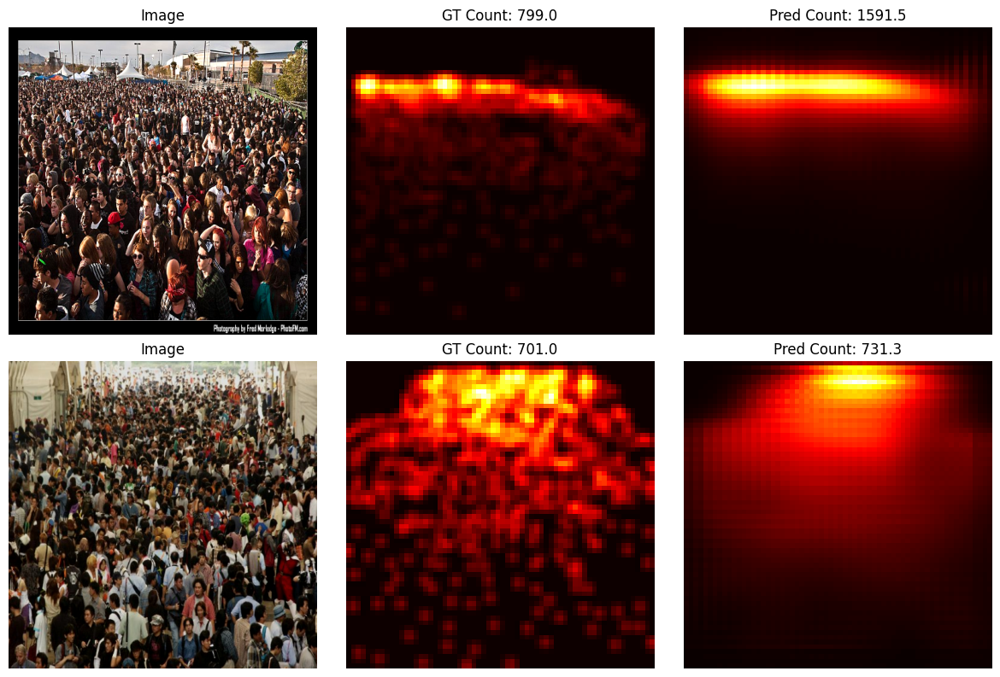


Epoch 6/100
  Batch 10/60 | Loss: 36.1170 | MAE: 111.25
  Batch 20/60 | Loss: 40.2848 | MAE: 84.75
  Batch 30/60 | Loss: 54.5714 | MAE: 115.52
  Batch 40/60 | Loss: 133.8932 | MAE: 75.75
  Batch 50/60 | Loss: 107.2170 | MAE: 138.03
  Batch 60/60 | Loss: 69.0975 | MAE: 36.94
Train Loss: 153.1845 | MAE: 169.15
Val   Loss: 175.5924 | MAE: 188.06
LR: 1.00e-04
💾 Saved Top Model: best_epoch_6.pth

Epoch 7/100
  Batch 10/60 | Loss: 118.5099 | MAE: 198.72
  Batch 20/60 | Loss: 490.8812 | MAE: 308.69
  Batch 30/60 | Loss: 89.7677 | MAE: 105.38
  Batch 40/60 | Loss: 103.2580 | MAE: 267.87
  Batch 50/60 | Loss: 113.4847 | MAE: 192.16
  Batch 60/60 | Loss: 54.3383 | MAE: 144.81
Train Loss: 151.7510 | MAE: 184.43
Val   Loss: 161.9984 | MAE: 157.83
LR: 1.00e-04
💾 Saved Top Model: best_epoch_7.pth

Epoch 8/100
  Batch 10/60 | Loss: 100.5581 | MAE: 321.12
  Batch 20/60 | Loss: 43.5357 | MAE: 166.03
  Batch 30/60 | Loss: 61.9798 | MAE: 94.00
  Batch 40/60 | Loss: 238.9140 | MAE: 142.42
  Batch 50/60 |

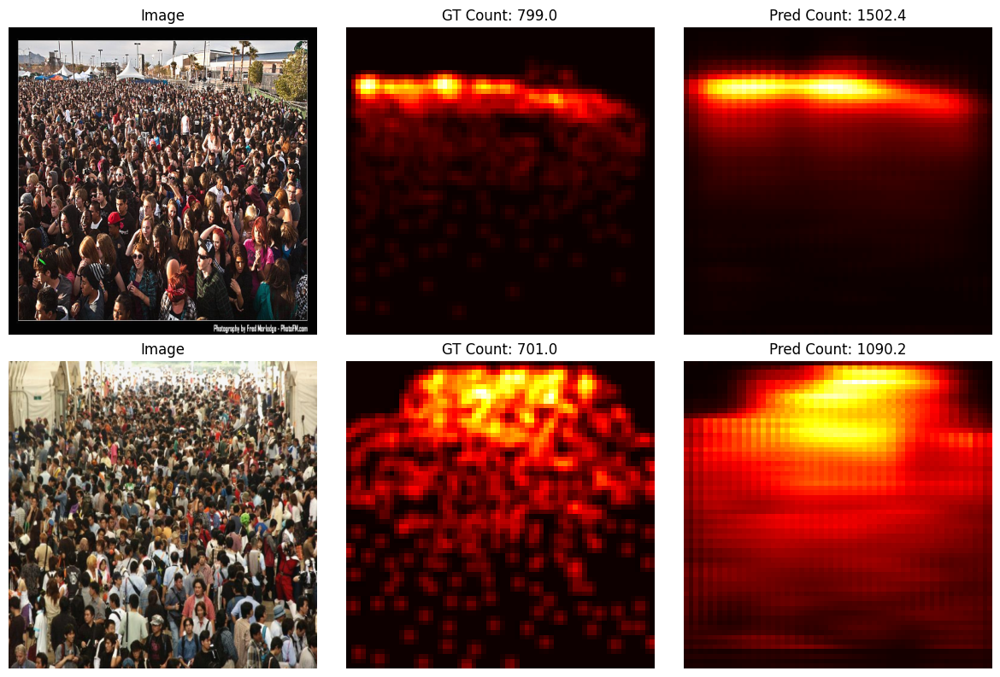


Epoch 11/100
  Batch 10/60 | Loss: 26.1691 | MAE: 64.27
  Batch 20/60 | Loss: 125.6404 | MAE: 117.00
  Batch 30/60 | Loss: 185.5732 | MAE: 324.06
  Batch 40/60 | Loss: 105.1076 | MAE: 188.19
  Batch 50/60 | Loss: 98.7943 | MAE: 269.69
  Batch 60/60 | Loss: 68.2043 | MAE: 165.56
Train Loss: 124.6039 | MAE: 147.81
Val   Loss: 143.0679 | MAE: 166.20
LR: 1.00e-04
💾 Saved Top Model: best_epoch_11.pth

Epoch 12/100
  Batch 10/60 | Loss: 52.7300 | MAE: 67.34
  Batch 20/60 | Loss: 72.5121 | MAE: 51.23
  Batch 30/60 | Loss: 24.2623 | MAE: 71.05
  Batch 40/60 | Loss: 236.2706 | MAE: 370.19
  Batch 50/60 | Loss: 178.3345 | MAE: 162.84
  Batch 60/60 | Loss: 248.6618 | MAE: 181.94
Train Loss: 124.9603 | MAE: 155.38
Val   Loss: 125.3045 | MAE: 128.80
LR: 1.00e-04
💾 Saved Top Model: best_epoch_12.pth

Epoch 13/100
  Batch 10/60 | Loss: 125.8118 | MAE: 181.56
  Batch 20/60 | Loss: 46.2912 | MAE: 84.34
  Batch 30/60 | Loss: 205.4604 | MAE: 357.94
  Batch 40/60 | Loss: 35.5001 | MAE: 63.72
  Batch 50/6

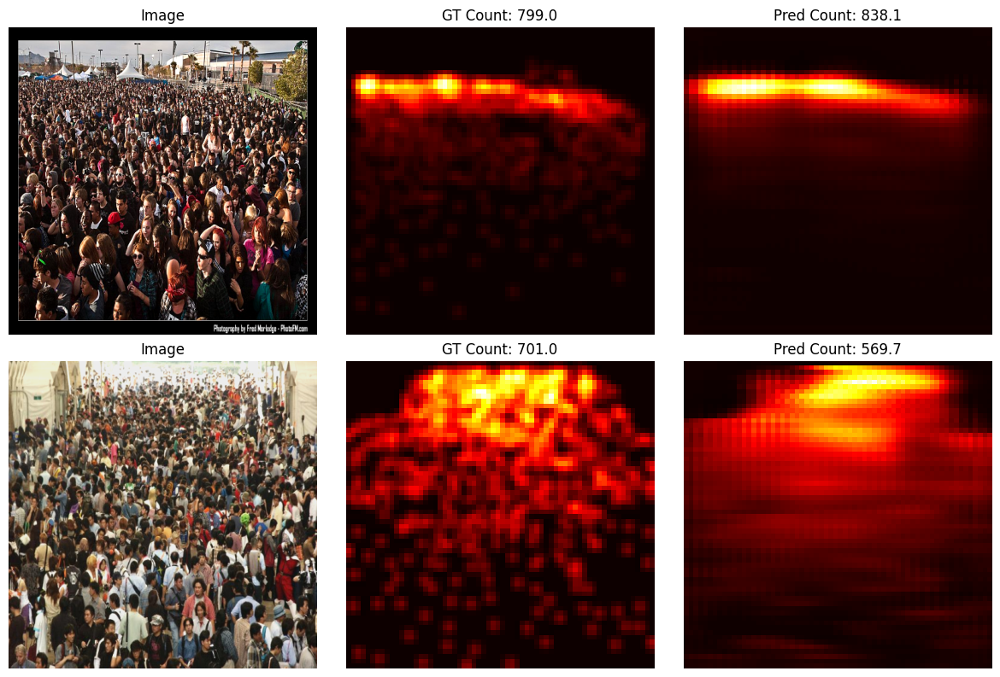


Epoch 16/100
  Batch 10/60 | Loss: 47.6615 | MAE: 131.59
  Batch 20/60 | Loss: 370.2041 | MAE: 506.88
  Batch 30/60 | Loss: 77.0969 | MAE: 113.91
  Batch 40/60 | Loss: 59.9561 | MAE: 207.64
  Batch 50/60 | Loss: 104.3537 | MAE: 105.53
  Batch 60/60 | Loss: 416.1461 | MAE: 180.06
Train Loss: 116.2686 | MAE: 141.23
Val   Loss: 134.6996 | MAE: 155.46
LR: 5.00e-05
⚠️ Early stop counter: 4/20

Epoch 17/100
  Batch 10/60 | Loss: 147.0924 | MAE: 185.78
  Batch 20/60 | Loss: 47.4565 | MAE: 88.00
  Batch 30/60 | Loss: 55.7078 | MAE: 47.94
  Batch 40/60 | Loss: 73.6399 | MAE: 162.73
  Batch 50/60 | Loss: 63.8057 | MAE: 127.72
  Batch 60/60 | Loss: 101.5056 | MAE: 157.03
Train Loss: 102.9230 | MAE: 125.28
Val   Loss: 136.5889 | MAE: 131.14
LR: 5.00e-05
⚠️ Early stop counter: 5/20

Epoch 18/100
  Batch 10/60 | Loss: 95.0109 | MAE: 177.37
  Batch 20/60 | Loss: 50.4126 | MAE: 89.11
  Batch 30/60 | Loss: 121.4054 | MAE: 190.38
  Batch 40/60 | Loss: 146.9358 | MAE: 165.06
  Batch 50/60 | Loss: 539.64

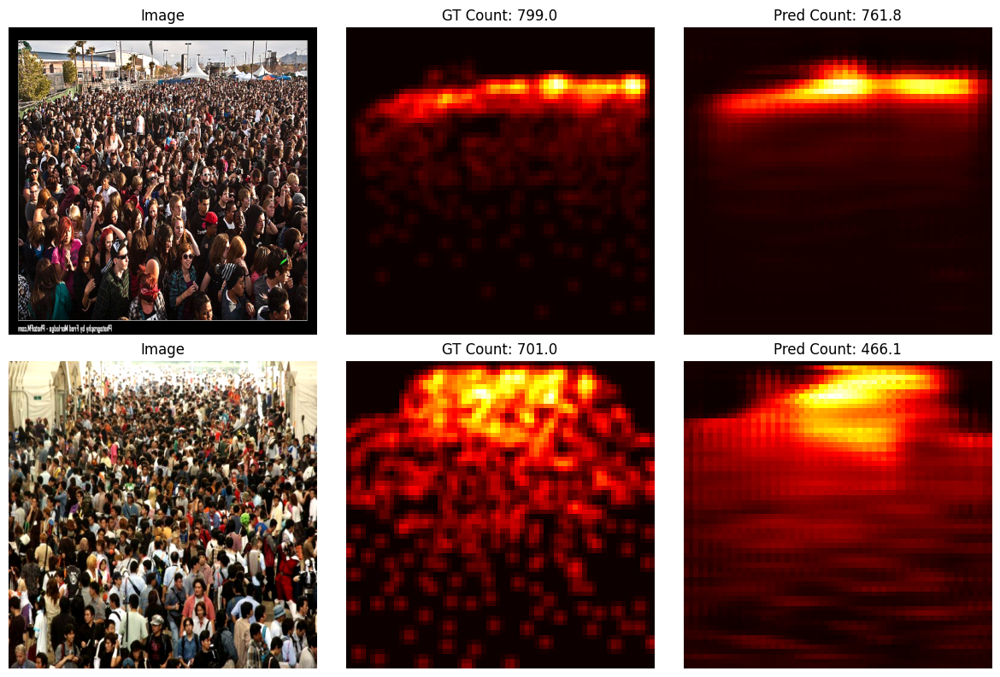


Epoch 21/100
  Batch 10/60 | Loss: 22.7965 | MAE: 33.00
  Batch 20/60 | Loss: 31.0515 | MAE: 57.81
  Batch 30/60 | Loss: 140.8322 | MAE: 172.31
  Batch 40/60 | Loss: 25.3978 | MAE: 39.19
  Batch 50/60 | Loss: 60.6813 | MAE: 145.25
  Batch 60/60 | Loss: 242.6497 | MAE: 385.75
Train Loss: 80.7280 | MAE: 109.27
Val   Loss: 130.6578 | MAE: 127.34
LR: 2.50e-05
⚠️ Early stop counter: 9/20

Epoch 22/100
  Batch 10/60 | Loss: 27.2564 | MAE: 38.02
  Batch 20/60 | Loss: 347.5773 | MAE: 134.77
  Batch 30/60 | Loss: 20.5205 | MAE: 44.49
  Batch 40/60 | Loss: 114.2834 | MAE: 223.94
  Batch 50/60 | Loss: 46.9881 | MAE: 142.78
  Batch 60/60 | Loss: 544.9214 | MAE: 355.19
Train Loss: 81.3093 | MAE: 97.96
Val   Loss: 129.3492 | MAE: 122.16
LR: 2.50e-05
⚠️ Early stop counter: 10/20

Epoch 23/100
  Batch 10/60 | Loss: 282.4147 | MAE: 254.75
  Batch 20/60 | Loss: 32.6490 | MAE: 63.81
  Batch 30/60 | Loss: 110.9448 | MAE: 145.44
  Batch 40/60 | Loss: 23.3945 | MAE: 33.31
  Batch 50/60 | Loss: 42.1209 | MA

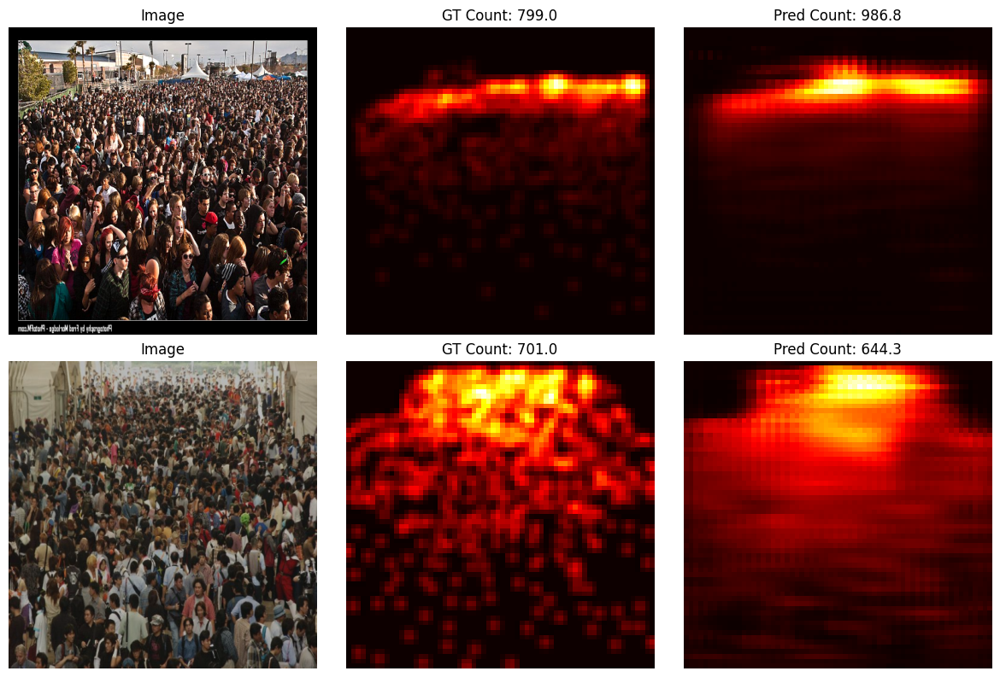


Epoch 26/100
  Batch 10/60 | Loss: 31.4341 | MAE: 46.89
  Batch 20/60 | Loss: 38.5550 | MAE: 88.12
  Batch 30/60 | Loss: 233.8549 | MAE: 308.34
  Batch 40/60 | Loss: 134.1814 | MAE: 229.00
  Batch 50/60 | Loss: 39.1338 | MAE: 43.25
  Batch 60/60 | Loss: 100.3464 | MAE: 85.50
Train Loss: 81.5726 | MAE: 102.25
Val   Loss: 126.7514 | MAE: 134.97
LR: 2.50e-05
⚠️ Early stop counter: 3/20

Epoch 27/100
  Batch 10/60 | Loss: 38.2550 | MAE: 107.50
  Batch 20/60 | Loss: 240.4163 | MAE: 239.25
  Batch 30/60 | Loss: 54.1172 | MAE: 106.06
  Batch 40/60 | Loss: 224.2247 | MAE: 154.22
  Batch 50/60 | Loss: 53.4812 | MAE: 101.88
  Batch 60/60 | Loss: 139.4227 | MAE: 187.44
Train Loss: 76.8721 | MAE: 104.19
Val   Loss: 142.0697 | MAE: 142.87
LR: 1.25e-05
⚠️ Early stop counter: 4/20

Epoch 28/100
  Batch 10/60 | Loss: 143.0365 | MAE: 250.75
  Batch 20/60 | Loss: 38.3717 | MAE: 62.06
  Batch 30/60 | Loss: 38.1132 | MAE: 61.09
  Batch 40/60 | Loss: 21.9712 | MAE: 36.97
  Batch 50/60 | Loss: 32.7864 | MA

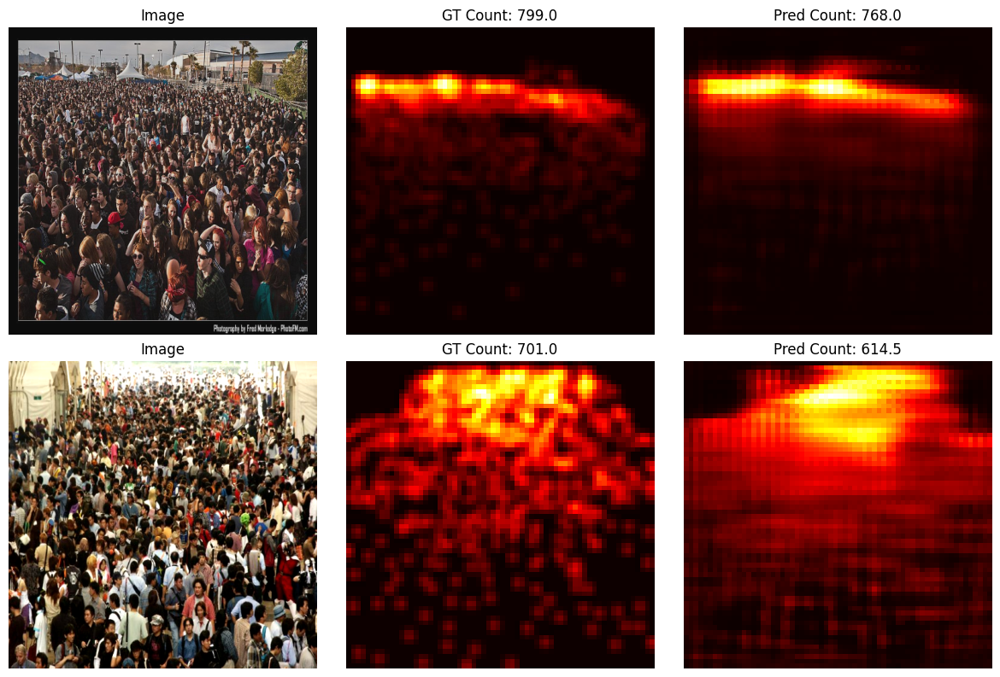


Epoch 31/100
  Batch 10/60 | Loss: 248.4328 | MAE: 107.69
  Batch 20/60 | Loss: 43.5953 | MAE: 89.50
  Batch 30/60 | Loss: 18.5878 | MAE: 53.20
  Batch 40/60 | Loss: 34.9680 | MAE: 57.75
  Batch 50/60 | Loss: 58.0585 | MAE: 95.06
  Batch 60/60 | Loss: 43.8537 | MAE: 31.89
Train Loss: 68.7577 | MAE: 89.74
Val   Loss: 126.8296 | MAE: 129.46
LR: 6.25e-06
⚠️ Early stop counter: 8/20

Epoch 32/100
  Batch 10/60 | Loss: 56.4532 | MAE: 74.88
  Batch 20/60 | Loss: 63.4517 | MAE: 76.06
  Batch 30/60 | Loss: 36.0368 | MAE: 27.69
  Batch 40/60 | Loss: 89.2054 | MAE: 75.50
  Batch 50/60 | Loss: 11.4383 | MAE: 29.19
  Batch 60/60 | Loss: 16.0553 | MAE: 61.81
Train Loss: 80.7433 | MAE: 93.60
Val   Loss: 121.7958 | MAE: 116.18
LR: 6.25e-06
⚠️ Early stop counter: 9/20

Epoch 33/100
  Batch 10/60 | Loss: 35.3670 | MAE: 87.06
  Batch 20/60 | Loss: 49.9988 | MAE: 74.95
  Batch 30/60 | Loss: 34.5319 | MAE: 97.19
  Batch 40/60 | Loss: 68.4698 | MAE: 120.56
  Batch 50/60 | Loss: 99.5393 | MAE: 134.19
  Bat

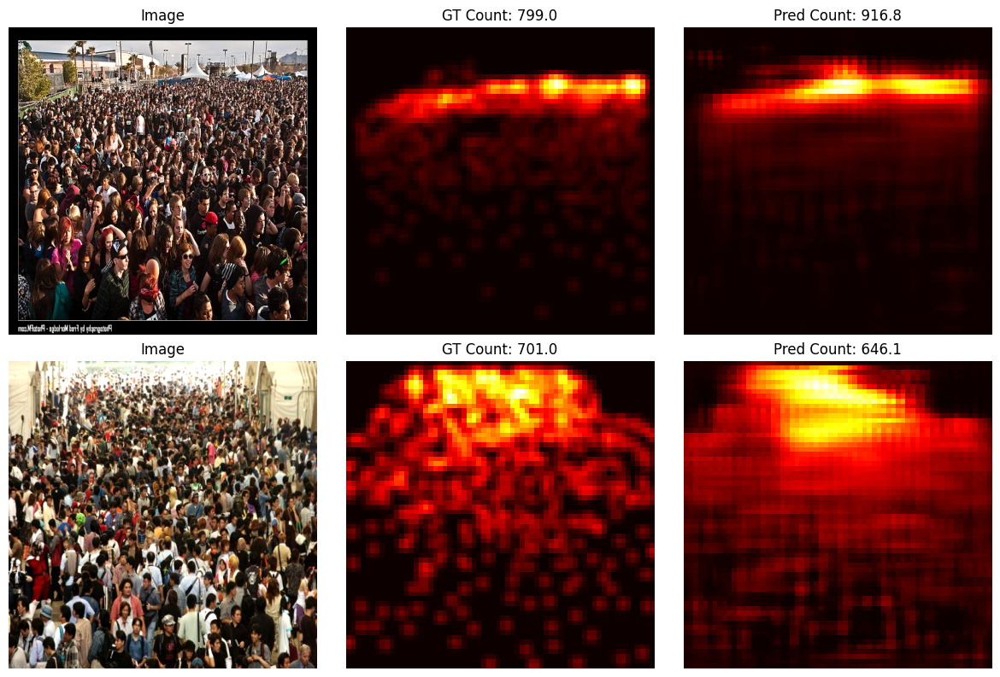


Epoch 36/100
  Batch 10/60 | Loss: 29.3015 | MAE: 42.53
  Batch 20/60 | Loss: 334.8131 | MAE: 179.12
  Batch 30/60 | Loss: 332.9353 | MAE: 248.09
  Batch 40/60 | Loss: 42.5344 | MAE: 99.88
  Batch 50/60 | Loss: 88.2399 | MAE: 39.13
  Batch 60/60 | Loss: 25.5928 | MAE: 41.69
Train Loss: 72.0920 | MAE: 93.61
Val   Loss: 127.7114 | MAE: 122.48
LR: 3.13e-06
⚠️ Early stop counter: 13/20

Epoch 37/100
  Batch 10/60 | Loss: 65.0023 | MAE: 85.16
  Batch 20/60 | Loss: 21.0080 | MAE: 15.94
  Batch 30/60 | Loss: 64.2641 | MAE: 91.69
  Batch 40/60 | Loss: 24.6645 | MAE: 59.00
  Batch 50/60 | Loss: 137.3835 | MAE: 69.94
  Batch 60/60 | Loss: 136.2080 | MAE: 123.31
Train Loss: 70.4635 | MAE: 91.76
Val   Loss: 128.9533 | MAE: 116.22
LR: 3.13e-06
⚠️ Early stop counter: 14/20

Epoch 38/100
  Batch 10/60 | Loss: 105.0631 | MAE: 125.94
  Batch 20/60 | Loss: 77.7774 | MAE: 162.87
  Batch 30/60 | Loss: 52.2504 | MAE: 145.09
  Batch 40/60 | Loss: 49.2689 | MAE: 52.47
  Batch 50/60 | Loss: 305.3961 | MAE: 3

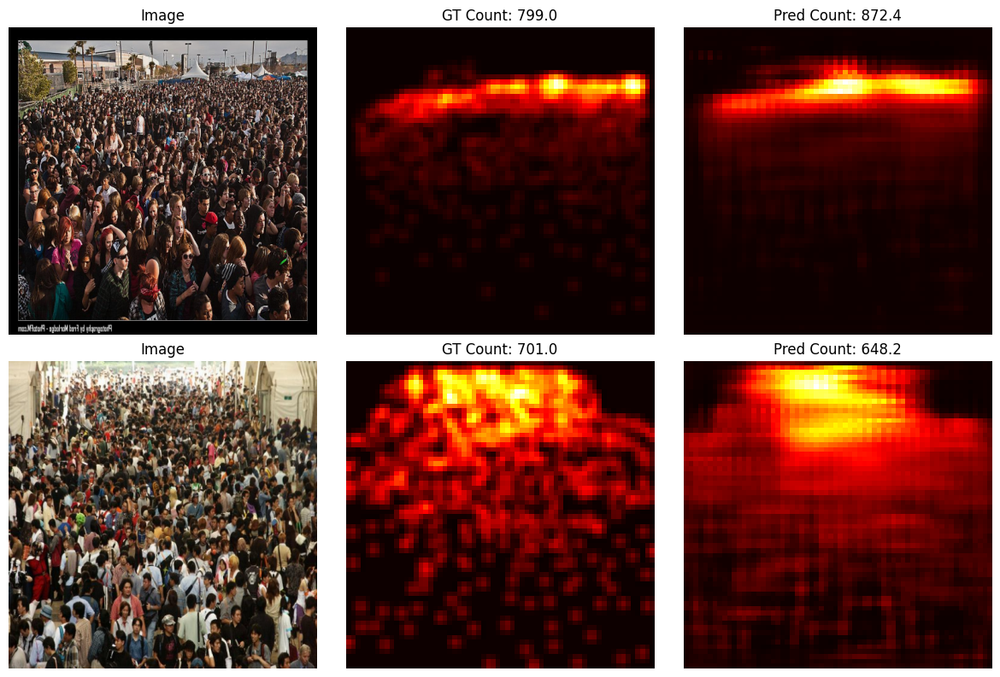


Epoch 41/100
  Batch 10/60 | Loss: 83.6947 | MAE: 135.02
  Batch 20/60 | Loss: 14.8098 | MAE: 38.03
  Batch 30/60 | Loss: 43.6635 | MAE: 82.69
  Batch 40/60 | Loss: 59.2852 | MAE: 164.13
  Batch 50/60 | Loss: 200.9070 | MAE: 191.19
  Batch 60/60 | Loss: 34.9703 | MAE: 66.97
Train Loss: 73.5731 | MAE: 87.31
Val   Loss: 121.9317 | MAE: 113.97
LR: 1.56e-06
⚠️ Early stop counter: 1/20

Epoch 42/100
  Batch 10/60 | Loss: 38.8824 | MAE: 53.25
  Batch 20/60 | Loss: 39.9910 | MAE: 41.00
  Batch 30/60 | Loss: 30.8997 | MAE: 92.89
  Batch 40/60 | Loss: 42.1497 | MAE: 78.34
  Batch 50/60 | Loss: 35.1101 | MAE: 30.19
  Batch 60/60 | Loss: 173.6204 | MAE: 210.50
Train Loss: 66.0156 | MAE: 82.87
Val   Loss: 126.9372 | MAE: 124.71
LR: 1.56e-06
⚠️ Early stop counter: 2/20

Epoch 43/100
  Batch 10/60 | Loss: 130.3546 | MAE: 109.31
  Batch 20/60 | Loss: 30.5917 | MAE: 43.59
  Batch 30/60 | Loss: 12.4915 | MAE: 37.69
  Batch 40/60 | Loss: 31.4814 | MAE: 102.66
  Batch 50/60 | Loss: 34.1258 | MAE: 35.59


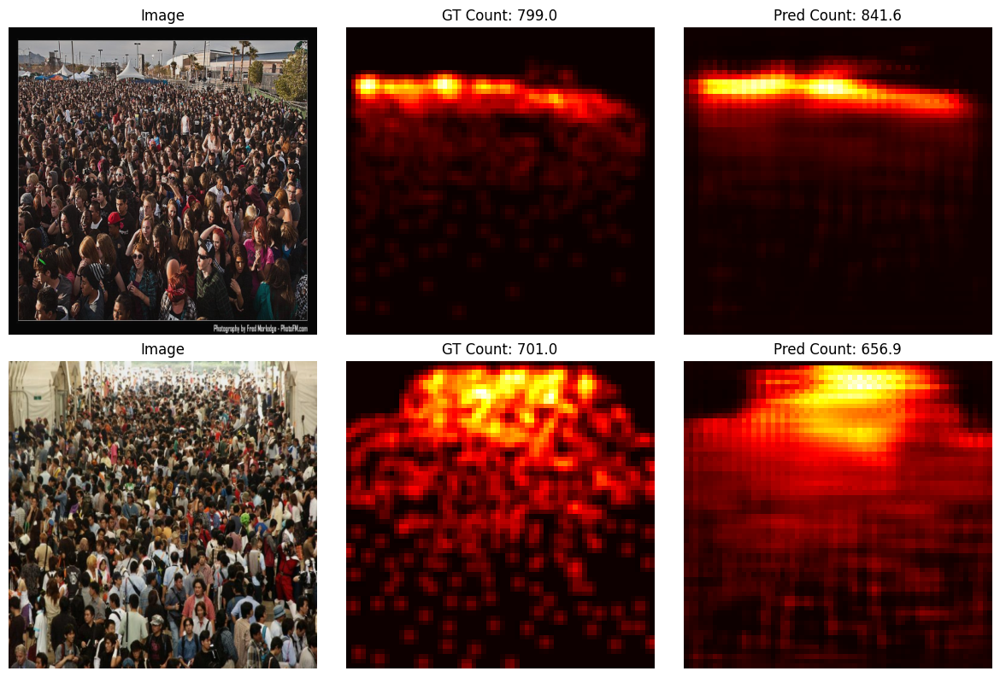


Epoch 46/100
  Batch 10/60 | Loss: 76.7693 | MAE: 193.50
  Batch 20/60 | Loss: 107.9866 | MAE: 108.75
  Batch 30/60 | Loss: 107.6254 | MAE: 91.44
  Batch 40/60 | Loss: 93.6471 | MAE: 73.53
  Batch 50/60 | Loss: 21.1479 | MAE: 53.00
  Batch 60/60 | Loss: 11.6536 | MAE: 11.48
Train Loss: 65.9361 | MAE: 88.43
Val   Loss: 127.1667 | MAE: 117.27
LR: 1.00e-06
⚠️ Early stop counter: 6/20

Epoch 47/100
  Batch 10/60 | Loss: 316.6717 | MAE: 248.84
  Batch 20/60 | Loss: 48.4499 | MAE: 51.00
  Batch 30/60 | Loss: 66.3467 | MAE: 55.86
  Batch 40/60 | Loss: 15.6934 | MAE: 49.09
  Batch 50/60 | Loss: 100.7990 | MAE: 135.12
  Batch 60/60 | Loss: 59.6915 | MAE: 97.87
Train Loss: 63.6856 | MAE: 77.98
Val   Loss: 125.2001 | MAE: 120.05
LR: 1.00e-06
⚠️ Early stop counter: 7/20

Epoch 48/100
  Batch 10/60 | Loss: 100.8952 | MAE: 76.03
  Batch 20/60 | Loss: 155.3938 | MAE: 143.94
  Batch 30/60 | Loss: 24.5150 | MAE: 58.59
  Batch 40/60 | Loss: 138.0777 | MAE: 243.25
  Batch 50/60 | Loss: 150.2239 | MAE: 2

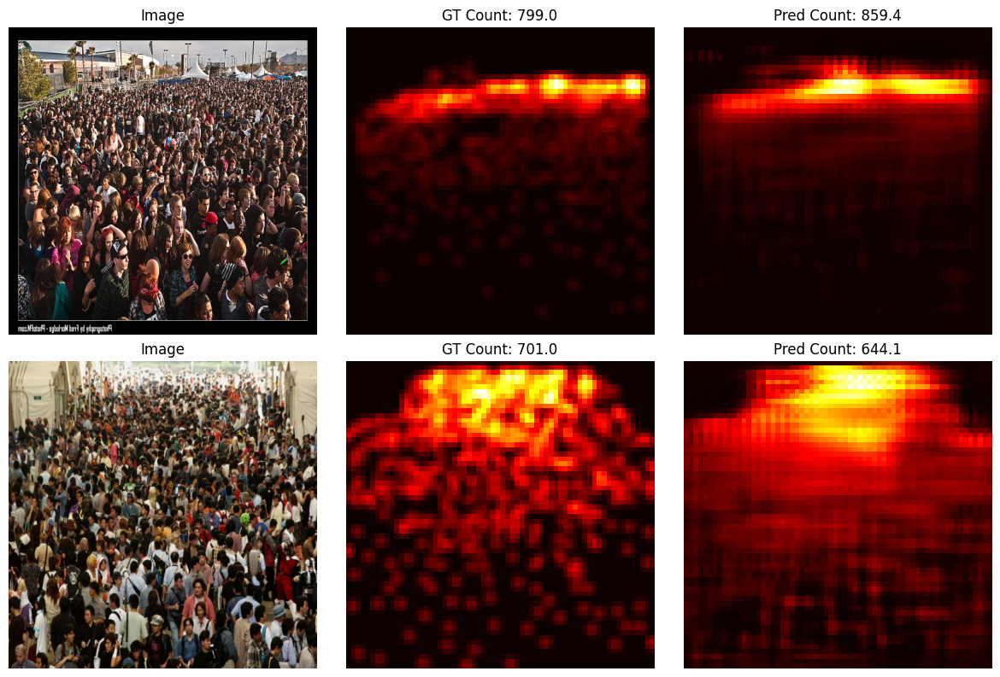


Epoch 51/100
  Batch 10/60 | Loss: 20.8844 | MAE: 40.62
  Batch 20/60 | Loss: 132.6685 | MAE: 126.00
  Batch 30/60 | Loss: 86.8420 | MAE: 108.31
  Batch 40/60 | Loss: 35.1609 | MAE: 67.69
  Batch 50/60 | Loss: 24.2196 | MAE: 35.31
  Batch 60/60 | Loss: 43.5141 | MAE: 48.56
Train Loss: 64.9329 | MAE: 83.76
Val   Loss: 125.2200 | MAE: 119.53
LR: 1.00e-06
⚠️ Early stop counter: 11/20

Epoch 52/100
  Batch 10/60 | Loss: 57.0609 | MAE: 97.72
  Batch 20/60 | Loss: 24.3333 | MAE: 72.91
  Batch 30/60 | Loss: 17.1298 | MAE: 10.47
  Batch 40/60 | Loss: 76.2102 | MAE: 133.00
  Batch 50/60 | Loss: 36.3662 | MAE: 66.81
  Batch 60/60 | Loss: 83.5990 | MAE: 92.19
Train Loss: 66.3760 | MAE: 82.96
Val   Loss: 122.6646 | MAE: 115.10
LR: 1.00e-06
⚠️ Early stop counter: 12/20

Epoch 53/100
  Batch 10/60 | Loss: 14.8321 | MAE: 56.81
  Batch 20/60 | Loss: 28.1865 | MAE: 97.53
  Batch 30/60 | Loss: 46.5547 | MAE: 119.44
  Batch 40/60 | Loss: 51.7811 | MAE: 45.16
  Batch 50/60 | Loss: 35.8641 | MAE: 60.36
  

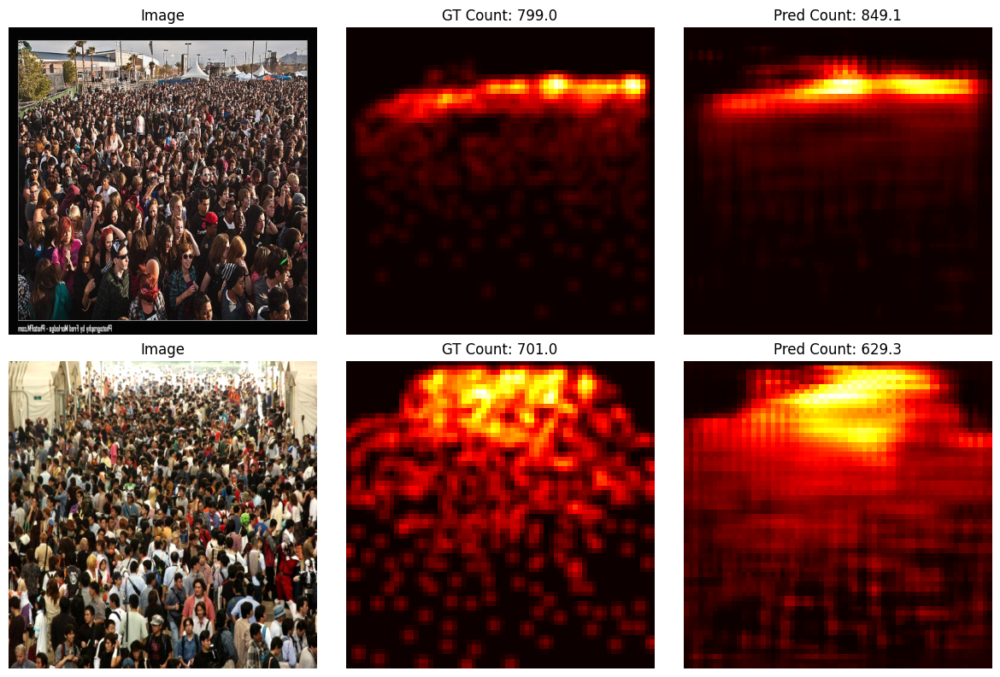


Epoch 56/100
  Batch 10/60 | Loss: 110.3851 | MAE: 50.13
  Batch 20/60 | Loss: 23.7513 | MAE: 18.62
  Batch 30/60 | Loss: 40.8920 | MAE: 82.09
  Batch 40/60 | Loss: 18.2392 | MAE: 28.34
  Batch 50/60 | Loss: 27.8407 | MAE: 52.05
  Batch 60/60 | Loss: 42.8627 | MAE: 88.66
Train Loss: 74.2216 | MAE: 94.81
Val   Loss: 120.8345 | MAE: 111.04
LR: 1.00e-06
⚠️ Early stop counter: 16/20

Epoch 57/100
  Batch 10/60 | Loss: 40.0248 | MAE: 92.06
  Batch 20/60 | Loss: 64.7734 | MAE: 125.00
  Batch 30/60 | Loss: 135.7795 | MAE: 48.63
  Batch 40/60 | Loss: 12.1448 | MAE: 26.44
  Batch 50/60 | Loss: 72.3008 | MAE: 103.06
  Batch 60/60 | Loss: 24.8998 | MAE: 65.72
Train Loss: 62.5753 | MAE: 84.22
Val   Loss: 124.0364 | MAE: 117.45
LR: 1.00e-06
⚠️ Early stop counter: 17/20

Epoch 58/100
  Batch 10/60 | Loss: 88.5384 | MAE: 93.16
  Batch 20/60 | Loss: 66.7415 | MAE: 169.80
  Batch 30/60 | Loss: 369.3338 | MAE: 226.69
  Batch 40/60 | Loss: 136.5692 | MAE: 157.56
  Batch 50/60 | Loss: 29.6631 | MAE: 33.8

In [11]:
print("🚀 Starting FULL CSRNet Training")
print("⚠️ This will run for 100 epochs and may take several hours")

# ------------------------------------------------------------
# Initialize Trainer
# ------------------------------------------------------------
trainer = Trainer(model, train_loader, val_loader)

# ------------------------------------------------------------
# Start Training
# ------------------------------------------------------------
history = trainer.train(num_epochs=Config.NUM_EPOCHS)

print("✅ Training completed successfully")

# ------------------------------------------------------------
# Save final trained model
# ------------------------------------------------------------
final_model_path = os.path.join(Config.SAVE_DIR, Config.MODEL_NAME)
torch.save(model.state_dict(), final_model_path)
print(f"💾 Final model saved at: {final_model_path}")


🎯 Testing ROI Occupancy Analyzer...
🎯 ROI Occupancy Analyzer initialized
📏 ROI: (100, 150) to (400, 450)
📐 ROI Size: 300 x 300 pixels
🧪 Testing ROI Occupancy Analyzer...
🔄 State change: NORMAL → CRITICAL (Occupancy: 24132.0)
📊 Occupancy: 24132.0
📊 Smoothed: 24132.0
🚦 State: CRITICAL


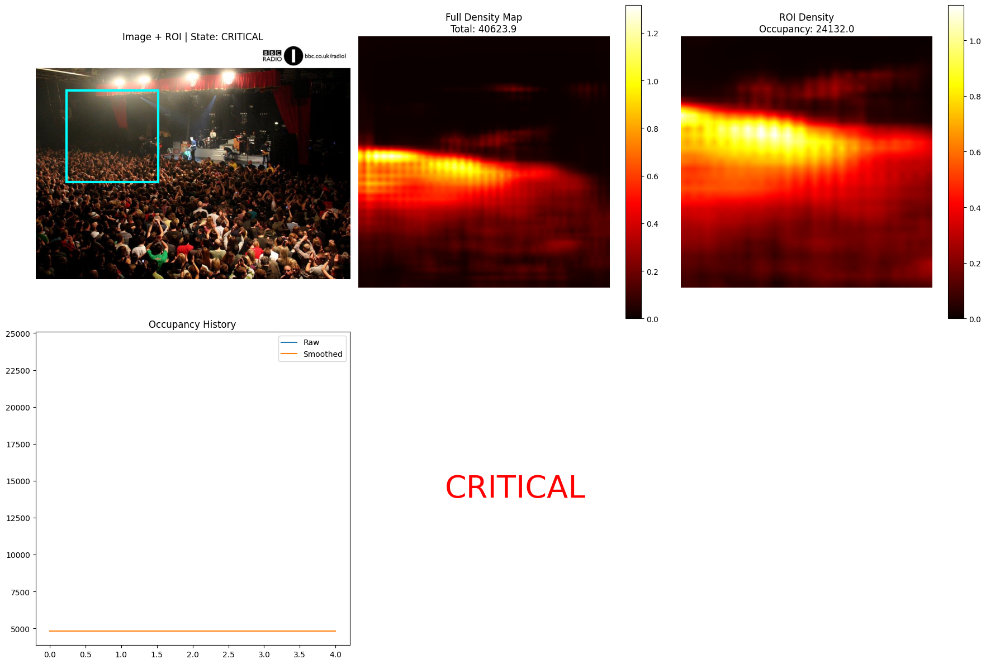

In [12]:
# Cell 12: ROI Occupancy Analyzer (FINAL DROP-IN FIXED VERSION)

class ROIOccupancyAnalyzer:
    """Analyze occupancy in Region of Interest with temporal smoothing"""

    def __init__(self, model, roi_coords: Dict = None):
        self.model = model
        self.model.eval()

        self.roi_coords = roi_coords or Config.ROI_COORDS
        self.x1, self.y1 = self.roi_coords['x1'], self.roi_coords['y1']
        self.x2, self.y2 = self.roi_coords['x2'], self.roi_coords['y2']

        self.occupancy_history = []
        self.timestamps = []
        self.smoothed_occupancy = None

        self.current_state = 'NORMAL'
        self.state_history = []

        print("🎯 ROI Occupancy Analyzer initialized")
        print(f"📏 ROI: ({self.x1}, {self.y1}) to ({self.x2}, {self.y2})")
        print(f"📐 ROI Size: {self.x2 - self.x1} x {self.y2 - self.y1} pixels")

    # ------------------------------------------------------------
    # ANALYZE IMAGE
    # ------------------------------------------------------------
    def analyze_image(self, image: np.ndarray) -> Dict[str, Any]:

        # Resize + normalize
        img_resized = cv2.resize(image, Config.IMG_SIZE[::-1])
        img_tensor = torch.from_numpy(img_resized.astype(np.float32) / 255.0)
        img_tensor = img_tensor.permute(2, 0, 1).unsqueeze(0).to(device)

        # Model inference
        with torch.no_grad():
            density_pred = self.model(img_tensor)

        # 🔧 CRITICAL FIX: Upsample density map to full resolution
        density_pred = torch.nn.functional.interpolate(
            density_pred,
            size=Config.IMG_SIZE,
            mode='bilinear',
            align_corners=False
        )

        density_map = density_pred.squeeze().cpu().numpy()

        # 🔧 OPTIONAL SAFETY (kept minimal)
        density_map = np.clip(density_map, 0, None)

        # --------------------------------------------------------
        # ✅ FINAL FIX: ROI is ALREADY in resized image space
        # --------------------------------------------------------
        roi_x1, roi_y1 = self.x1, self.y1
        roi_x2, roi_y2 = self.x2, self.y2

        roi_x1 = max(0, min(roi_x1, density_map.shape[1] - 1))
        roi_y1 = max(0, min(roi_y1, density_map.shape[0] - 1))
        roi_x2 = max(roi_x1 + 1, min(roi_x2, density_map.shape[1]))
        roi_y2 = max(roi_y1 + 1, min(roi_y2, density_map.shape[0]))

        roi_density = density_map[roi_y1:roi_y2, roi_x1:roi_x2]
        occupancy = float(roi_density.sum())

        smoothed_occupancy = self._apply_temporal_smoothing(occupancy)

        self.occupancy_history.append(occupancy)
        self.timestamps.append(time.time())

        if len(self.occupancy_history) > 100:
            self.occupancy_history.pop(0)
            self.timestamps.pop(0)

        control_state = self._determine_control_state(smoothed_occupancy)

        return {
            'timestamp': datetime.now().strftime('%H:%M:%S'),
            'occupancy': occupancy,
            'smoothed_occupancy': smoothed_occupancy,
            'control_state': control_state,
            'roi_density': roi_density,
            'full_density_map': density_map,
            'roi_coords': {
                'x1': roi_x1, 'y1': roi_y1,
                'x2': roi_x2, 'y2': roi_y2
            },
            'original_image': image
        }

    # ------------------------------------------------------------
    # TEMPORAL SMOOTHING
    # ------------------------------------------------------------
    def _apply_temporal_smoothing(self, occupancy: float) -> float:
        if self.smoothed_occupancy is None:
            self.smoothed_occupancy = occupancy
        else:
            self.smoothed_occupancy = (
                Config.SMOOTHING_ALPHA * occupancy +
                (1 - Config.SMOOTHING_ALPHA) * self.smoothed_occupancy
            )
        return self.smoothed_occupancy

    # ------------------------------------------------------------
    # CONTROL STATE LOGIC
    # ------------------------------------------------------------
    def _determine_control_state(self, occupancy: float) -> str:
        thresholds = Config.CONTROL_THRESHOLDS

        if occupancy < thresholds['NORMAL_MAX']:
            state = 'NORMAL'
        elif occupancy < thresholds['WARNING_MAX']:
            state = 'WARNING'
        else:
            state = 'CRITICAL'

        if state != self.current_state:
            print(f"🔄 State change: {self.current_state} → {state} "
                  f"(Occupancy: {occupancy:.1f})")
            self.current_state = state

        self.state_history.append({
            'timestamp': time.time(),
            'state': state,
            'occupancy': occupancy
        })

        return state

    # ------------------------------------------------------------
    # VISUALIZATION
    # ------------------------------------------------------------
    def visualize_analysis(self, result: Dict):

        fig, axes = plt.subplots(2, 3, figsize=(18, 12))

        img = result['original_image']
        axes[0, 0].imshow(img)

        roi = result['roi_coords']
        rect = patches.Rectangle(
            (roi['x1'], roi['y1']),
            roi['x2'] - roi['x1'],
            roi['y2'] - roi['y1'],
            linewidth=3, edgecolor='cyan', facecolor='none'
        )

        axes[0, 0].add_patch(rect)
        axes[0, 0].set_title(f"Image + ROI | State: {result['control_state']}")
        axes[0, 0].axis('off')

        im1 = axes[0, 1].imshow(result['full_density_map'], cmap='hot')
        axes[0, 1].set_title(f"Full Density Map\nTotal: {result['full_density_map'].sum():.1f}")
        axes[0, 1].axis('off')
        plt.colorbar(im1, ax=axes[0, 1])

        im2 = axes[0, 2].imshow(result['roi_density'], cmap='hot')
        axes[0, 2].set_title(f"ROI Density\nOccupancy: {result['occupancy']:.1f}")
        axes[0, 2].axis('off')
        plt.colorbar(im2, ax=axes[0, 2])

        axes[1, 0].plot(self.occupancy_history, label='Raw')
        axes[1, 0].plot(
            np.convolve(self.occupancy_history,
                        np.ones(5)/5, mode='valid'),
            label='Smoothed'
        )
        axes[1, 0].legend()
        axes[1, 0].set_title("Occupancy History")

        state_color = {'NORMAL': 'green', 'WARNING': 'orange', 'CRITICAL': 'red'}
        axes[1, 1].text(0.5, 0.5, result['control_state'],
                        fontsize=40, color=state_color[result['control_state']],
                        ha='center', va='center')
        axes[1, 1].axis('off')

        axes[1, 2].axis('off')

        plt.tight_layout()
        plt.show()

    # ------------------------------------------------------------
    # QUICK TEST
    # ------------------------------------------------------------
    def test_with_sample_image(self):
        print("🧪 Testing ROI Occupancy Analyzer...")

        sample_dir = os.path.join(Config.PART_A_PATH, 'train_data', 'images')
        img_files = [f for f in os.listdir(sample_dir) if f.endswith('.jpg')]

        if not img_files:
            print("❌ No images found")
            return

        img_path = os.path.join(sample_dir, img_files[0])
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        result = self.analyze_image(image)

        print(f"📊 Occupancy: {result['occupancy']:.1f}")
        print(f"📊 Smoothed: {result['smoothed_occupancy']:.1f}")
        print(f"🚦 State: {result['control_state']}")

        self.visualize_analysis(result)


# ------------------------------------------------------------
# TEST ROI ANALYZER
# ------------------------------------------------------------
print("🎯 Testing ROI Occupancy Analyzer...")
roi_analyzer = ROIOccupancyAnalyzer(model)
roi_analyzer.test_with_sample_image()


⚙️ Testing Rule-Based Controller...
⚙️ Rule-Based Controller initialized
📊 Available states: ['NORMAL', 'WARNING', 'CRITICAL']

🧪 Simulating control system...
📊 Occupancy sequence: [15, 25, 35, 45, 30, 20, 10, 50, 40, 25]

Step 1: Occupancy = 15.0
  State: NORMAL
  Actions: ['allow_entry', 'normal_speed']
  Entry Rate: 1.0
  Speed Factor: 1.0

Step 2: Occupancy = 25.0
🔄 Control State Changed: WARNING
   Occupancy: 25.0
   Actions: restrict_entry, reduce_speed
   Entry Rate: 0.5
   Speed Factor: 0.7
  State: WARNING
  Actions: ['restrict_entry', 'reduce_speed']
  Entry Rate: 0.5
  Speed Factor: 0.7

Step 3: Occupancy = 35.0
  State: WARNING
  Actions: ['restrict_entry', 'reduce_speed']
  Entry Rate: 0.5
  Speed Factor: 0.7

Step 4: Occupancy = 45.0
🔄 Control State Changed: CRITICAL
   Occupancy: 45.0
   Actions: restrict_entry, reduce_speed, alert_staff
   Entry Rate: 0.2
   Speed Factor: 0.4
  State: CRITICAL
  Actions: ['restrict_entry', 'reduce_speed', 'alert_staff']
  Entry Rate: 0.

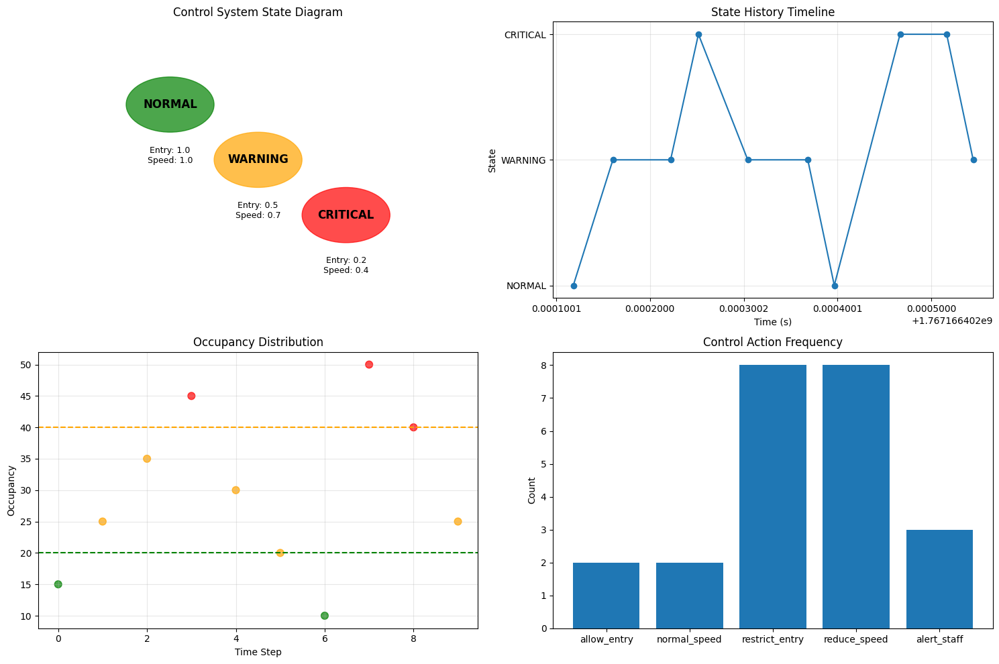


📊 Control System Summary:
  Current state: WARNING
  Total control actions: 10
  Total state changes: 6
  Average occupancy: 29.50


In [13]:
# Cell 13: Rule-Based Control System (DROP-IN FIXED VERSION)

class RuleBasedController:
    """Rule-based control system for escalator management"""

    def __init__(self):
        self.states = {
            'NORMAL': {
                'description': 'Low occupancy - Normal operation',
                'entry_rate': 1.0,
                'speed_factor': 1.0,
                'actions': ['allow_entry', 'normal_speed'],
                'color': 'green'
            },
            'WARNING': {
                'description': 'Moderate occupancy - Reduced operation',
                'entry_rate': 0.5,
                'speed_factor': 0.7,
                'actions': ['restrict_entry', 'reduce_speed'],
                'color': 'orange'
            },
            'CRITICAL': {
                'description': 'High occupancy - Restricted operation',
                'entry_rate': 0.2,
                'speed_factor': 0.4,
                'actions': ['restrict_entry', 'reduce_speed', 'alert_staff'],
                'color': 'red'
            }
        }

        self.current_state = 'NORMAL'
        self.state_history = []
        self.control_log = []

        print("⚙️ Rule-Based Controller initialized")
        print(f"📊 Available states: {list(self.states.keys())}")

    # ------------------------------------------------------------
    # UPDATE STATE
    # ------------------------------------------------------------
    def update_state(self, occupancy: float) -> Dict:
        """
        Update control state based on occupancy
        """

        thresholds = Config.CONTROL_THRESHOLDS

        # Determine new state
        if occupancy < thresholds['NORMAL_MAX']:
            new_state = 'NORMAL'
        elif occupancy < thresholds['WARNING_MAX']:
            new_state = 'WARNING'
        else:
            new_state = 'CRITICAL'

        # Check if state changed
        state_changed = (new_state != self.current_state)
        self.current_state = new_state

        state_config = self.states[new_state]

        # Create control action
        control_action = {
            'timestamp': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
            'occupancy': occupancy,
            'state': new_state,
            'state_changed': state_changed,
            'entry_rate': state_config['entry_rate'],
            'speed_factor': state_config['speed_factor'],
            'actions': state_config['actions'],
            'description': state_config['description']
        }

        # Log actions
        self.control_log.append(control_action)

        # 🔧 FIX: store state_changed in history
        self.state_history.append({
            'timestamp': time.time(),
            'state': new_state,
            'occupancy': occupancy,
            'state_changed': state_changed
        })

        # Print state transition
        if state_changed:
            print(f"🔄 Control State Changed: {new_state}")
            print(f"   Occupancy: {occupancy:.1f}")
            print(f"   Actions: {', '.join(state_config['actions'])}")
            print(f"   Entry Rate: {state_config['entry_rate']}")
            print(f"   Speed Factor: {state_config['speed_factor']}")

        return control_action

    # ------------------------------------------------------------
    # SIMULATION
    # ------------------------------------------------------------
    def simulate_occupancy_sequence(self, occupancy_sequence: List[float]):
        """Simulate controller using a sequence of occupancy values"""

        print("\n🧪 Simulating control system...")
        print(f"📊 Occupancy sequence: {occupancy_sequence}")

        results = []

        for i, occupancy in enumerate(occupancy_sequence):
            print(f"\nStep {i + 1}: Occupancy = {occupancy:.1f}")
            action = self.update_state(occupancy)
            results.append(action)

            print(f"  State: {action['state']}")
            print(f"  Actions: {action['actions']}")
            print(f"  Entry Rate: {action['entry_rate']}")
            print(f"  Speed Factor: {action['speed_factor']}")

        return results

    # ------------------------------------------------------------
    # VISUALIZATION
    # ------------------------------------------------------------
    def visualize_control_system(self):
        """Visualize state transitions and control behavior"""

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))

        # ------------------ State Diagram ------------------
        ax = axes[0, 0]
        pos = {'NORMAL': (0.3, 0.7), 'WARNING': (0.5, 0.5), 'CRITICAL': (0.7, 0.3)}

        for state, (x, y) in pos.items():
            color = self.states[state]['color']
            ax.add_patch(plt.Circle((x, y), 0.1, color=color, alpha=0.7))
            ax.text(x, y, state, ha='center', va='center',
                    fontsize=12, fontweight='bold')
            ax.text(
                x, y - 0.15,
                f"Entry: {self.states[state]['entry_rate']}\nSpeed: {self.states[state]['speed_factor']}",
                ha='center', va='top', fontsize=9
            )

        ax.set_title('Control System State Diagram')
        ax.axis('off')

        # ------------------ State Timeline ------------------
        ax = axes[0, 1]
        if self.state_history:
            times = [h['timestamp'] for h in self.state_history]
            state_map = {'NORMAL': 1, 'WARNING': 2, 'CRITICAL': 3}
            values = [state_map[h['state']] for h in self.state_history]

            ax.plot(times, values, marker='o')
            ax.set_yticks([1, 2, 3])
            ax.set_yticklabels(['NORMAL', 'WARNING', 'CRITICAL'])
            ax.set_title('State History Timeline')
            ax.set_xlabel('Time (s)')
            ax.set_ylabel('State')
            ax.grid(True, alpha=0.3)

        # ------------------ Occupancy Scatter ------------------
        ax = axes[1, 0]
        if self.state_history:
            occ = [h['occupancy'] for h in self.state_history]
            colors = [self.states[h['state']]['color'] for h in self.state_history]

            ax.scatter(range(len(occ)), occ, c=colors, s=60, alpha=0.7)
            ax.axhline(Config.CONTROL_THRESHOLDS['NORMAL_MAX'], linestyle='--', color='green')
            ax.axhline(Config.CONTROL_THRESHOLDS['WARNING_MAX'], linestyle='--', color='orange')
            ax.set_title('Occupancy Distribution')
            ax.set_xlabel('Time Step')
            ax.set_ylabel('Occupancy')
            ax.grid(True, alpha=0.3)

        # ------------------ Action Frequency ------------------
        ax = axes[1, 1]
        if self.control_log:
            action_counts = {}
            for log in self.control_log:
                for a in log['actions']:
                    action_counts[a] = action_counts.get(a, 0) + 1

            ax.bar(action_counts.keys(), action_counts.values())
            ax.set_title('Control Action Frequency')
            ax.set_ylabel('Count')

        plt.tight_layout()
        plt.show()

        # ------------------ Summary ------------------
        print("\n📊 Control System Summary:")
        print(f"  Current state: {self.current_state}")
        print(f"  Total control actions: {len(self.control_log)}")
        print(f"  Total state changes: {sum(h['state_changed'] for h in self.state_history)}")

        if self.state_history:
            avg_occ = np.mean([h['occupancy'] for h in self.state_history])
            print(f"  Average occupancy: {avg_occ:.2f}")


# ------------------------------------------------------------
# TEST CONTROLLER
# ------------------------------------------------------------
print("⚙️ Testing Rule-Based Controller...")
controller = RuleBasedController()

# Example test (synthetic)
test_sequence = [15, 25, 35, 45, 30, 20, 10, 50, 40, 25]
controller.simulate_occupancy_sequence(test_sequence)

# Visualization
controller.visualize_control_system()

In [14]:
# Cell 14: Complete System Integration (FINAL – DROP-IN FIXED)

class EscalatorControlSystem:
    """Complete end-to-end escalator control system"""

    def __init__(self, model_path: str = None):
        # ------------------------------------------------------------
        # Load trained model OR create fresh model
        # ------------------------------------------------------------
        if model_path and os.path.exists(model_path):
            print(f"📦 Loading trained model from: {model_path}")
            self.model = CSRNet().to(device)

            checkpoint = torch.load(model_path, map_location=device)

            # 🔧 FIX: compatible with Trainer.save_model()
            if 'model' in checkpoint:
                self.model.load_state_dict(checkpoint['model'])
            else:
                self.model.load_state_dict(checkpoint)

            self.model.eval()
            model_status = "Loaded (trained)"
        else:
            print("🔧 Creating new CSRNet model (untrained)")
            self.model = CSRNet(load_weights=True).to(device)
            self.model.eval()
            model_status = "New (VGG pretrained only)"

        # ------------------------------------------------------------
        # Initialize components
        # ------------------------------------------------------------
        self.roi_analyzer = ROIOccupancyAnalyzer(self.model)
        self.controller = RuleBasedController()

        # System state
        self.is_running = False
        self.processed_frames = 0
        self.start_time = None

        print("✅ Escalator Control System initialized")
        print(f"   Model: {model_status}")
        print(f"   Device: {device}")
        print(f"   ROI: {Config.ROI_COORDS}")

    # ------------------------------------------------------------
    # PROCESS SINGLE IMAGE
    # ------------------------------------------------------------
    def process_image(self, image: np.ndarray) -> Dict:
        """Process a single RGB image through full pipeline"""

        analysis_result = self.roi_analyzer.analyze_image(image)

        control_action = self.controller.update_state(
            analysis_result['smoothed_occupancy']
        )

        result = {
            **analysis_result,
            'control_action': control_action,
            'frame_number': self.processed_frames
        }

        self.processed_frames += 1
        return result

    # ------------------------------------------------------------
    # PROCESS VIDEO FILE
    # ------------------------------------------------------------
    def process_video_file(self, video_path: str, max_frames: int = 100):

        if not os.path.exists(video_path):
            print(f"❌ Video file not found: {video_path}")
            return []

        print(f"🎬 Processing video: {video_path}")
        print(f"📊 Max frames: {max_frames}")

        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            print("❌ Failed to open video file")
            return []

        self.is_running = True
        self.processed_frames = 0
        self.start_time = time.time()

        frame_results = []

        while self.is_running and self.processed_frames < max_frames:
            ret, frame = cap.read()
            if not ret:
                break

            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            result = self.process_image(frame_rgb)
            frame_results.append(result)

            if self.processed_frames % 10 == 0:
                print(
                    f"  Frame {self.processed_frames}: "
                    f"Occupancy={result['smoothed_occupancy']:.1f}, "
                    f"State={result['control_state']}"
                )

        cap.release()
        self.is_running = False

        elapsed = time.time() - self.start_time
        print("\n✅ Video processing complete")
        print(f"📊 Frames processed: {len(frame_results)}")
        print(f"⏱️  Time taken: {elapsed:.2f}s")
        print(f"📈 Average FPS: {len(frame_results)/elapsed:.2f}")

        return frame_results

    # ------------------------------------------------------------
    # SIMULATED LIVE CAMERA (DEMO ONLY)
    # ------------------------------------------------------------
    def process_live_camera(self, duration: int = 20):
        """
        Simulated live input (NO VISION).
        For demo & control logic validation only.
        """

        print("📷 Starting SIMULATED live processing")
        print(f"⏱️  Duration: {duration} seconds")

        self.is_running = True
        self.processed_frames = 0
        self.start_time = time.time()

        frame_results = []

        while self.is_running and (time.time() - self.start_time) < duration:
            time.sleep(0.1)  # ~10 FPS

            t = time.time() - self.start_time
            synthetic_occupancy = max(
                0,
                20 + 15 * np.sin(0.5 * t) + 5 * np.random.randn()
            )

            control_action = self.controller.update_state(synthetic_occupancy)

            result = {
                'timestamp': datetime.now().strftime('%H:%M:%S'),
                'occupancy': synthetic_occupancy,
                'smoothed_occupancy': synthetic_occupancy,
                'control_state': control_action['state'],
                'control_action': control_action,
                'frame_number': self.processed_frames
            }

            frame_results.append(result)
            self.processed_frames += 1

            if self.processed_frames % 5 == 0:
                print(
                    f"  Frame {self.processed_frames}: "
                    f"Occupancy={synthetic_occupancy:.1f}, "
                    f"State={control_action['state']}"
                )

        self.is_running = False

        print("\n✅ Simulated live processing complete")
        print(f"📊 Frames processed: {len(frame_results)}")

        return frame_results


🤖 Testing RL Foundation Setup...
🤖 RL Foundation initialized
📊 State dimension: 5
🎯 Action space size: 5
💰 Reward weights: {'efficiency': 1.0, 'safety': -2.0, 'comfort': 0.5, 'energy': -0.1, 'state_change': -0.2}
📊 Example state vector: [0.355      0.5        0.29166666 0.         0.        ]
💰 Example reward: 0.076


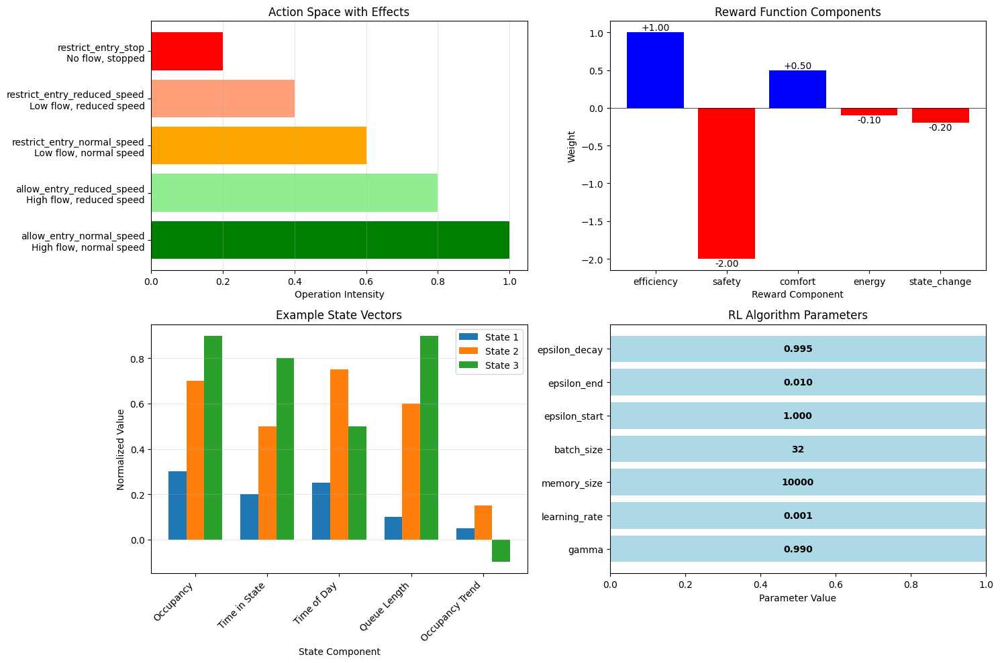


🤖 RL Foundation Summary:
State Space Dimension: 5
Action Space Size: 5
Reward Function: Weighted sum of 5 components
RL Algorithm: DQN with experience replay
Training Parameters: Gamma=0.99, LR=0.001

🎯 Future Extensions Possible:
  1. Implement DQN/PPO algorithm
  2. Add prioritized experience replay
  3. Implement dueling networks
  4. Add multi-agent coordination
  5. Real-time training with safety constraints


In [15]:
# Cell 15: RL Foundation Setup
class RLFoundation:
    """Reinforcement Learning foundation for future extension"""

    def __init__(self):
        # State space definition
        self.state_dim = 5  # [occupancy, time_in_state, time_of_day, queue_length, occupancy_trend]

        # Action space definition
        self.action_space = [
            'allow_entry_normal_speed',
            'allow_entry_reduced_speed',
            'restrict_entry_normal_speed',
            'restrict_entry_reduced_speed',
            'restrict_entry_stop'
        ]
        self.action_dim = len(self.action_space)

        # Reward function components
        self.reward_weights = {
            'efficiency': 1.0,      # Maximize throughput
            'safety': -2.0,         # Penalize high occupancy
            'comfort': 0.5,         # Reward smooth operation
            'energy': -0.1,         # Penalize high speed
            'state_change': -0.2    # Penalize frequent state changes
        }

        # RL algorithm parameters
        self.rl_params = {
            'gamma': 0.99,          # Discount factor
            'learning_rate': 0.001,
            'memory_size': 10000,
            'batch_size': 32,
            'epsilon_start': 1.0,
            'epsilon_end': 0.01,
            'epsilon_decay': 0.995
        }

        print("🤖 RL Foundation initialized")
        print(f"📊 State dimension: {self.state_dim}")
        print(f"🎯 Action space size: {self.action_dim}")
        print(f"💰 Reward weights: {self.reward_weights}")

    def define_state_space(self, current_data: Dict) -> np.ndarray:
        """
        Define state vector from current system data

        Args:
            current_data: Dictionary with current system state

        Returns:
            State vector as numpy array
        """
        # Extract or calculate state components
        occupancy = current_data.get('smoothed_occupancy', 0)

        # Normalize components
        state = np.zeros(self.state_dim, dtype=np.float32)

        # 1. Occupancy (normalized to 0-1)
        state[0] = occupancy / 100.0  # Assume max 100 people

        # 2. Time in current state (normalized)
        # This would come from state history in real implementation
        state[1] = 0.5  # Placeholder

        # 3. Time of day (hour normalized to 0-1)
        hour = datetime.now().hour
        state[2] = hour / 24.0

        # 4. Queue length (normalized)
        # This would come from additional sensors
        state[3] = 0.0  # Placeholder

        # 5. Occupancy trend (derivative, normalized)
        # This would come from occupancy history
        state[4] = 0.0  # Placeholder

        return state

    def define_reward_function(self, state: np.ndarray, action: int,
                              next_state: np.ndarray) -> float:
        """
        Define reward function for RL

        Args:
            state: Current state vector
            action: Action taken
            next_state: Next state vector

        Returns:
            Reward value
        """
        reward = 0.0

        # 1. Efficiency reward (based on throughput)
        # Higher occupancy with smooth flow is good
        efficiency_reward = next_state[0] * (1.0 - abs(next_state[4]))  # occupancy * (1 - |trend|)
        reward += self.reward_weights['efficiency'] * efficiency_reward

        # 2. Safety penalty (penalize high occupancy)
        if next_state[0] > 0.8:  # Above 80% capacity
            safety_penalty = (next_state[0] - 0.8) * 2.0
            reward += self.reward_weights['safety'] * safety_penalty

        # 3. Comfort reward (penalize sudden changes)
        state_change_magnitude = np.linalg.norm(next_state - state)
        comfort_reward = -state_change_magnitude
        reward += self.reward_weights['comfort'] * comfort_reward

        # 4. Energy penalty (penalize high speed)
        # Action 0,2 are normal speed, others are reduced/stop
        if action in [0, 2]:  # Normal speed actions
            energy_penalty = 1.0
        else:
            energy_penalty = 0.5

        reward += self.reward_weights['energy'] * energy_penalty

        # 5. State change penalty
        # Penalize frequent state changes (would need state history)
        reward += self.reward_weights['state_change'] * 0.0  # Placeholder

        return reward

    def define_q_network(self) -> nn.Module:
        """Define Q-network for DQN"""
        class QNetwork(nn.Module):
            def __init__(self, state_dim: int, action_dim: int):
                super(QNetwork, self).__init__()

                self.network = nn.Sequential(
                    nn.Linear(state_dim, 128),
                    nn.ReLU(),
                    nn.Dropout(0.2),
                    nn.Linear(128, 64),
                    nn.ReLU(),
                    nn.Dropout(0.2),
                    nn.Linear(64, 32),
                    nn.ReLU(),
                    nn.Linear(32, action_dim)
                )

            def forward(self, x: torch.Tensor) -> torch.Tensor:
                return self.network(x)

        return QNetwork(self.state_dim, self.action_dim)

    def create_replay_buffer(self):
        """Create replay buffer for experience replay"""
        from collections import deque
        import random

        class ReplayBuffer:
            def __init__(self, capacity: int):
                self.buffer = deque(maxlen=capacity)

            def push(self, state, action, reward, next_state, done):
                self.buffer.append((state, action, reward, next_state, done))

            def sample(self, batch_size: int):
                return random.sample(self.buffer, batch_size)

            def __len__(self):
                return len(self.buffer)

        return ReplayBuffer(self.rl_params['memory_size'])

    def train_dqn_step(self, q_network, target_network, optimizer,
                      replay_buffer, batch_size: int, gamma: float):
        """Single DQN training step"""
        if len(replay_buffer) < batch_size:
            return 0.0

        # Sample batch
        batch = replay_buffer.sample(batch_size)
        states, actions, rewards, next_states, dones = zip(*batch)

        # Convert to tensors
        states = torch.FloatTensor(np.array(states))
        actions = torch.LongTensor(np.array(actions)).unsqueeze(1)
        rewards = torch.FloatTensor(np.array(rewards)).unsqueeze(1)
        next_states = torch.FloatTensor(np.array(next_states))
        dones = torch.FloatTensor(np.array(dones)).unsqueeze(1)

        # Compute Q values
        current_q = q_network(states).gather(1, actions)

        # Compute target Q values
        with torch.no_grad():
            next_q = target_network(next_states).max(1)[0].unsqueeze(1)
            target_q = rewards + gamma * next_q * (1 - dones)

        # Compute loss
        loss = F.mse_loss(current_q, target_q)

        # Optimize
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(q_network.parameters(), 1.0)
        optimizer.step()

        return loss.item()

    def visualize_rl_components(self):
        """Visualize RL foundation components"""
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))

        # 1. Action space visualization
        ax = axes[0, 0]
        actions = self.action_space
        action_effects = [
            'High flow, normal speed',
            'High flow, reduced speed',
            'Low flow, normal speed',
            'Low flow, reduced speed',
            'No flow, stopped'
        ]

        y_pos = np.arange(len(actions))

        ax.barh(y_pos, [1.0, 0.8, 0.6, 0.4, 0.2],
               color=['green', 'lightgreen', 'orange', 'lightsalmon', 'red'])
        ax.set_yticks(y_pos)
        ax.set_yticklabels([f'{a}\n{e}' for a, e in zip(actions, action_effects)])
        ax.set_xlabel('Operation Intensity')
        ax.set_title('Action Space with Effects')
        ax.grid(True, alpha=0.3, axis='x')

        # 2. Reward components
        ax = axes[0, 1]
        components = list(self.reward_weights.keys())
        weights = list(self.reward_weights.values())

        colors = ['blue' if w > 0 else 'red' for w in weights]
        bars = ax.bar(components, weights, color=colors)
        ax.set_xlabel('Reward Component')
        ax.set_ylabel('Weight')
        ax.set_title('Reward Function Components')
        ax.axhline(y=0, color='black', linewidth=0.5)

        for bar, weight in zip(bars, weights):
            ax.text(bar.get_x() + bar.get_width()/2., bar.get_height(),
                   f'{weight:+.2f}', ha='center', va='bottom' if weight > 0 else 'top')

        # 3. State space visualization
        ax = axes[1, 0]
        state_labels = ['Occupancy', 'Time in State', 'Time of Day', 'Queue Length', 'Occupancy Trend']

        # Create example state vectors
        example_states = [
            [0.3, 0.2, 0.25, 0.1, 0.05],   # Morning light
            [0.7, 0.5, 0.75, 0.6, 0.15],   # Evening rush
            [0.9, 0.8, 0.5, 0.9, -0.1],    # Critical
        ]

        x = np.arange(len(state_labels))
        width = 0.25

        for i, state in enumerate(example_states):
            offset = (i - 1) * width
            ax.bar(x + offset, state, width, label=f'State {i+1}')

        ax.set_xlabel('State Component')
        ax.set_ylabel('Normalized Value')
        ax.set_title('Example State Vectors')
        ax.set_xticks(x)
        ax.set_xticklabels(state_labels, rotation=45, ha='right')
        ax.legend()
        ax.grid(True, alpha=0.3, axis='y')

        # 4. RL algorithm parameters
        ax = axes[1, 1]
        params = list(self.rl_params.keys())
        values = list(self.rl_params.values())

        # Convert to strings for display
        value_strs = [f'{v:.3f}' if isinstance(v, float) else str(v) for v in values]

        y_pos = np.arange(len(params))
        ax.barh(y_pos, [1] * len(params), color='lightblue')
        ax.set_yticks(y_pos)
        ax.set_yticklabels(params)
        ax.set_xlabel('Parameter Value')
        ax.set_title('RL Algorithm Parameters')
        ax.set_xlim(0, 1)

        # Add parameter values as text
        for i, (param, value_str) in enumerate(zip(params, value_strs)):
            ax.text(0.5, i, f'{value_str}',
                   va='center', ha='center', fontweight='bold')

        plt.tight_layout()
        plt.show()

        # Print RL foundation summary
        print("\n🤖 RL Foundation Summary:")
        print("=" * 50)
        print(f"State Space Dimension: {self.state_dim}")
        print(f"Action Space Size: {self.action_dim}")
        print(f"Reward Function: Weighted sum of {len(self.reward_weights)} components")
        print(f"RL Algorithm: DQN with experience replay")
        print(f"Training Parameters: Gamma={self.rl_params['gamma']}, "
              f"LR={self.rl_params['learning_rate']}")
        print("\n🎯 Future Extensions Possible:")
        print("  1. Implement DQN/PPO algorithm")
        print("  2. Add prioritized experience replay")
        print("  3. Implement dueling networks")
        print("  4. Add multi-agent coordination")
        print("  5. Real-time training with safety constraints")

# Test RL foundation
print("🤖 Testing RL Foundation Setup...")
rl_foundation = RLFoundation()

# Test state definition
test_data = {'smoothed_occupancy': 35.5}
state_vector = rl_foundation.define_state_space(test_data)
print(f"📊 Example state vector: {state_vector}")

# Test reward calculation
next_state = np.array([0.4, 0.3, 0.5, 0.2, 0.1])
reward = rl_foundation.define_reward_function(state_vector, 0, next_state)
print(f"💰 Example reward: {reward:.3f}")

# Visualize RL components
rl_foundation.visualize_rl_components()

📊 Testing System Evaluation...

🧪 Running evaluation...
📊 Evaluating CSRNet Model Performance...
✅ CSRNet Evaluation Complete
   📈 MAE: 80.09
   📉 RMSE: 125.00
   📋 Mean Relative Error: 21.4%
   🎯 R² Score: 0.875

🎯 Evaluating ROI Occupancy Accuracy...
📁 Loaded 182 images from test set
🎯 ROI Occupancy Analyzer initialized
📏 ROI: (100, 150) to (400, 450)
📐 ROI Size: 300 x 300 pixels
🔄 State change: NORMAL → CRITICAL (Occupancy: 937.5)
  Sample 1: True=9079.4, Pred=937.5, Error=8141.9
🎯 ROI Occupancy Analyzer initialized
📏 ROI: (100, 150) to (400, 450)
📐 ROI Size: 300 x 300 pixels
🔄 State change: NORMAL → CRITICAL (Occupancy: 937.9)
  Sample 2: True=11294.5, Pred=937.9, Error=10356.6
🎯 ROI Occupancy Analyzer initialized
📏 ROI: (100, 150) to (400, 450)
📐 ROI Size: 300 x 300 pixels
🔄 State change: NORMAL → CRITICAL (Occupancy: 937.4)
  Sample 3: True=7234.9, Pred=937.4, Error=6297.4
🎯 ROI Occupancy Analyzer initialized
📏 ROI: (100, 150) to (400, 450)
📐 ROI Size: 300 x 300 pixels
🔄 State ch

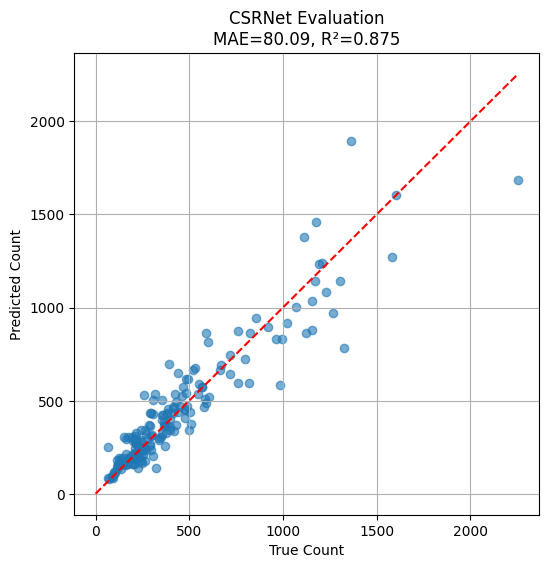


✅ Evaluation Complete


In [16]:
# Cell 16: Evaluation and Metrics (FINAL – LOCKED VERSION)

import torch.nn.functional as F

class SystemEvaluator:
    """Comprehensive system evaluation and metrics"""

    def __init__(self, model, test_loader):
        self.model = model
        self.test_loader = test_loader
        self.metrics = {}

    # ------------------------------------------------------------
    # CSRNet Evaluation
    # ------------------------------------------------------------
    def evaluate_model(self):
        """Evaluate CSRNet model performance (GT resized to output resolution)"""
        print("📊 Evaluating CSRNet Model Performance...")

        self.model.eval()
        all_pred_counts = []
        all_true_counts = []

        with torch.no_grad():
            for images, density_maps in self.test_loader:
                images = images.to(device)
                density_maps = density_maps.to(device)

                predictions = self.model(images)

                # 🔧 Resize GT density to match model output
                gt_resized = F.interpolate(
                    density_maps,
                    size=predictions.shape[2:],
                    mode='bilinear',
                    align_corners=False
                )

                pred_counts = predictions.sum(dim=[1, 2, 3]).cpu().numpy()
                true_counts = gt_resized.sum(dim=[1, 2, 3]).cpu().numpy()

                all_pred_counts.extend(pred_counts)
                all_true_counts.extend(true_counts)

        all_pred_counts = np.array(all_pred_counts)
        all_true_counts = np.array(all_true_counts)

        # -------- Metrics --------
        mae = np.mean(np.abs(all_pred_counts - all_true_counts))
        mse = np.mean((all_pred_counts - all_true_counts) ** 2)
        rmse = np.sqrt(mse)

        relative_errors = np.abs(all_pred_counts - all_true_counts) / (all_true_counts + 1e-8)
        mean_relative_error = np.mean(relative_errors) * 100

        ss_total = np.sum((all_true_counts - np.mean(all_true_counts)) ** 2)
        ss_residual = np.sum((all_true_counts - all_pred_counts) ** 2)
        r_squared = 1 - (ss_residual / ss_total)

        self.metrics['csrnet'] = {
            'mae': mae,
            'mse': mse,
            'rmse': rmse,
            'mean_relative_error': mean_relative_error,
            'r_squared': r_squared,
            'pred_counts': all_pred_counts,
            'true_counts': all_true_counts
        }

        print("✅ CSRNet Evaluation Complete")
        print(f"   📈 MAE: {mae:.2f}")
        print(f"   📉 RMSE: {rmse:.2f}")
        print(f"   📋 Mean Relative Error: {mean_relative_error:.1f}%")
        print(f"   🎯 R² Score: {r_squared:.3f}")

        return self.metrics['csrnet']

    # ------------------------------------------------------------
    # ROI Accuracy Evaluation
    # ------------------------------------------------------------
    def evaluate_roi_accuracy(self, num_samples: int = 10):
        """Evaluate ROI occupancy accuracy"""
        print("\n🎯 Evaluating ROI Occupancy Accuracy...")

        test_dataset = ShanghaiTechDataset(Config.PART_A_PATH, mode='test')
        errors = []

        for i in range(min(num_samples, len(test_dataset))):
            img_tensor, density_map = test_dataset[i]
            image = img_tensor.permute(1, 2, 0).numpy()

            analyzer = ROIOccupancyAnalyzer(self.model)
            result = analyzer.analyze_image(image)

            # Resize GT density to model output resolution
            density_gt_resized = F.interpolate(
                density_map.unsqueeze(0),
                size=result['full_density_map'].shape,
                mode='bilinear',
                align_corners=False
            ).squeeze().cpu().numpy()

            roi = result['roi_coords']
            true_count = density_gt_resized[
                roi['y1']:roi['y2'],
                roi['x1']:roi['x2']
            ].sum()

            pred_count = result['occupancy']
            error = abs(pred_count - true_count)
            errors.append(error)

            if i < 3:
                print(
                    f"  Sample {i+1}: True={true_count:.1f}, "
                    f"Pred={pred_count:.1f}, Error={error:.1f}"
                )

        if errors:
            self.metrics['roi_accuracy'] = {
                'mean_error': np.mean(errors),
                'std_error': np.std(errors),
                'max_error': np.max(errors),
                'errors': errors
            }

            print("\n📊 ROI Accuracy Summary")
            print(f"   Mean Error: {np.mean(errors):.2f}")
            print(f"   Std Error: {np.std(errors):.2f}")
            print(f"   Max Error: {np.max(errors):.2f}")

        return self.metrics.get('roi_accuracy', {})

    # ------------------------------------------------------------
    # Control System Evaluation
    # ------------------------------------------------------------
    def evaluate_control_system(self, occupancy_sequence):
        """Evaluate rule-based controller"""
        print("\n⚙️ Evaluating Control System...")

        controller = RuleBasedController()
        results = []

        for occ in occupancy_sequence:
            results.append(controller.update_state(occ))

        state_changes = sum(
            results[i]['state'] != results[i - 1]['state']
            for i in range(1, len(results))
        )

        self.metrics['control_system'] = {
            'total_steps': len(results),
            'state_changes': state_changes,
            'results': results
        }

        print("📊 Control System Results")
        print(f"   Total Steps: {len(results)}")
        print(f"   State Changes: {state_changes}")

        return self.metrics['control_system']

    # ------------------------------------------------------------
    # Visualization
    # ------------------------------------------------------------
    def visualize_evaluation(self):
        """Visualize CSRNet evaluation"""
        if 'csrnet' not in self.metrics:
            print("❌ No metrics to visualize")
            return

        csr = self.metrics['csrnet']

        plt.figure(figsize=(6, 6))
        plt.scatter(csr['true_counts'], csr['pred_counts'], alpha=0.6)
        max_val = max(csr['true_counts'].max(), csr['pred_counts'].max())
        plt.plot([0, max_val], [0, max_val], 'r--')
        plt.xlabel("True Count")
        plt.ylabel("Predicted Count")
        plt.title(f"CSRNet Evaluation\nMAE={csr['mae']:.2f}, R²={csr['r_squared']:.3f}")
        plt.grid(True)
        plt.show()

        print("\n✅ Evaluation Complete")


# =======================
# RUN EVALUATION
# =======================

print("📊 Testing System Evaluation...")
evaluator = SystemEvaluator(model, test_loader)

print("\n🧪 Running evaluation...")
evaluator.evaluate_model()
evaluator.evaluate_roi_accuracy(num_samples=5)
evaluator.evaluate_control_system([10, 25, 35, 45, 30, 15, 50, 40, 20, 10])
evaluator.visualize_evaluation()
